In [1]:
"""
Here we try to modify Z to incorporate the new hour and minute!!
We need not extract existing h and m (but wuld be nice if network itself has some incentive to decouple it)
"""
%run common/imp_and_args1.ipynb
if ntbk:
    sys.argv = ['main', '--batchSize', '64', 
                '--niter', '10000', '--newGetZ', '--getZ', '--useLN']#, "--dataset", "clocks"]#, "--critic_iters", "5"] , '--useLN'
print(sys.argv)
#Now add some parser argument here, commented examples follow
#Boolean, action is what it will be set to when passed
#parser.add_argument('--notLog', action='store_true', help='if passed, no logging will happen. Logging is off for jupyter anyways.;')
#String
#parser.add_argument('--opFolder', default='', help='Override the logging folder.')
#int
#parser.add_argument('--seed', type=int, default=1, help='Seed for pyTorcj.')
#and float
#parser.add_argument('--clamp_lower', type=float, default=-0.01)

parser.add_argument('--critic_iters', type=int,   default=5, 
                    help='# of critic iterations.')
parser.add_argument('--dim',          type=int,   default=64, 
                    help='in gen start with 8*dim channels.')
parser.add_argument('--lambda_value', type=float, default=10.0, 
                    help='value of lambda for gradient penality WGAN_GP.')
parser.add_argument('--beta2', type=float, default=0.9, 
                    help='value of beta2.')
parser.add_argument('--newGetZ', action='store_true', 
                    help="if passed, GetZ won't be created form D, "+
                    " but will be created from scratch. And Batch "+
                    " Normalization would be used.")
parser.add_argument('--useLN', action='store_true', 
                    help="if passed, Layer Norm would be used, else batch norm.")
parser.add_argument('--getZ', action='store_true', 
                    help="if passed, then inverse mapping will get z, else it will get L.")

%run common/args_and_rest.ipynb
%run common/Utils.ipynb
%config Completer.use_jedi = False

['main', '--batchSize', '64', '--niter', '10000', '--newGetZ', '--getZ', '--useLN']
Namespace(adam=False, batchSize=64, beta1=0.5, beta2=0.9, clamp_lower=-0.01, clamp_upper=0.01, critic_iters=5, dataroot='/home/aknirala/data/lsun', dataset='paired_clocks', dim=64, fineSize=64, getZ=True, lambda_value=10.0, loadSize=96, lrD=0.0002, lrG=0.0002, nEpochs=5, nThreads=4, nc=3, ndf=64, newGetZ=True, ngf=64, ngpu=1, niter=10000, noCuda=False, noise='normal', notLog=False, nz=100, opFolder='', resumeFldr='', seed=1, useLN=True, workers=0)
OP folder won't be created as we are in jupyter notebook and logging is off
Arguments are:  Namespace(adam=False, batchSize=64, beta1=0.5, beta2=0.9, clamp_lower=-0.01, clamp_upper=0.01, critic_iters=5, dataroot='/home/aknirala/data/lsun', dataset='paired_clocks', dim=64, fineSize=64, getZ=True, lambda_value=10.0, loadSize=96, lrD=0.0002, lrG=0.0002, nEpochs=5, nThreads=4, nc=3, ndf=64, newGetZ=True, ngf=64, ngpu=1, niter=10000, noCuda=False, noise='normal', n

In [2]:
invModelPath = "invZModels/"
if (opt.useLN and opt.getZ):
    invModelPath += "LNZ/inverseZL_73.mdl"
elif ((not opt.useLN) and opt.getZ):
    invModelPath += "BNZ/inverseZL_13.mdl"
elif (opt.useLN and (not opt.getZ)):
    invModelPath += "LNL/inverseZL_21.mdl"
elif ((not opt.useLN) and (not opt.getZ)):
    invModelPath += "BNL/inverseZL_14.mdl"
plog("We would be using model: ", invModelPath)

We would be using model:  invZModels/LNZ/inverseZL_73.mdl


In [3]:
class MeanPoolConv(nn.Module):
    """
    For conv: padding is same, stride is by default 1
    """
    def __init__(self, name, in_ch, out_ch,
                 filter_size, he_init=True, bias=True):
        super(MeanPoolConv, self).__init__()
        self.main = nn.Sequential()
        avg_pool = nn.AvgPool2d(2)
        conv = nn.Conv2d(in_ch, out_ch, filter_size, 
                         padding = (filter_size - 1)//2, bias=bias)
        if he_init:
            nn.init.kaiming_uniform_(conv.weight)
        self.main.add_module(name + "_avg_pool", avg_pool)
        self.main.add_module(name + "_conv", conv)
    def forward(self, inputs):
        return self.main(inputs)

class ConvMeanPool(nn.Module):
    """
    For conv: padding is same, stride is by default 1
    """
    def __init__(self, name, in_ch, out_ch,
                 filter_size, he_init=True, bias=True):
        super(ConvMeanPool, self).__init__()
        self.main = nn.Sequential()
        conv = nn.Conv2d(in_ch, out_ch, filter_size, 
                         padding = (filter_size - 1)//2, bias=bias)
        if he_init:
            nn.init.kaiming_uniform_(conv.weight)
        avg_pool = nn.AvgPool2d(2)
        self.main.add_module(name + "_conv", conv)
        self.main.add_module(name + "_avg_pool", avg_pool)
    def forward(self, inputs):
        return self.main(inputs)

class UpsampleConv(nn.Module):
    """
    For conv: There is no padding here, stride is by default 1
    """
    def __init__(self, name, in_ch, out_ch,
                 filter_size, he_init=True, bias=True):
        super(UpsampleConv, self).__init__()
        self.main = nn.Sequential()
        up_sample = nn.UpsamplingNearest2d(scale_factor = 2)
        conv = nn.Conv2d(in_ch, out_ch, filter_size, 
                         padding = (filter_size - 1)//2, bias=bias)
        if he_init:
            nn.init.kaiming_uniform_(conv.weight)
        self.main.add_module(name + "_up_sample", up_sample)
        self.main.add_module(name + "_conv", conv)
    def forward(self, inputs):
        return self.main(inputs)

In [4]:
# Residual block Down
class ResidualBlockDown(nn.Module):
    def __init__(self, name, in_ch, out_ch, size, k_size = 3, stride=1, 
                 l_norm = True):
        """
        resample = down means ResidualBlock is being used in discriminator
        So we will use LayerNorm instead of batch_norm in discriminator.
        
        Here is what is happening (for down):
        i/p --> || Normalize, ReLU, Conv1 (no channel change) || 
         |    --> Normalize, ReLU, ConvMeanPool (Sz half & channel change)
         |_=> MeanPoolConv (Channel chane & sz half)
        
        """
        super(ResidualBlockDown, self).__init__()
        self.s_cut = MeanPoolConv(name + "_down_mpc", in_ch, out_ch, k_size)
        if l_norm:
            self.nmlz1 = nn.LayerNorm([in_ch, size, size])
            self.nmlz2 = nn.LayerNorm([in_ch, size, size])
        else:
            #We would use batch norm
            self.nmlz1 = nn.BatchNorm2d(in_ch)
            self.nmlz2 = nn.BatchNorm2d(in_ch)
        #
        #Now we would reach the same dimension as reached by 
        #      self.shortcut via two convolutinal loops.
        #  self.shortcut would reach: [B, O_Ch, W//2, W//2]
        #No channel change
        self.R1 = nn.ReLU()
        self.conv1 = nn.Conv2d(in_ch, in_ch, k_size,
                              padding = (k_size - 1)//2, bias=False)
        self.R2 = nn.ReLU()
        self.conv2 = ConvMeanPool(name + "_down_cmp", in_ch, out_ch, k_size)
        
    def forward(self, x):
        s_cut = self.s_cut(x)
        out = self.R1(self.nmlz1(x))
        out = self.conv1(out)
        #out = self.R2(out)
        out = self.R2(self.nmlz2(out))
        out = self.conv2(out)
        return out + s_cut

# Residual block Up
class ResidualBlockUp(nn.Module):
    def __init__(self, name, in_ch, out_ch, k_size = 3, stride=1):
        super(ResidualBlockUp, self).__init__()
        self.s_cut = UpsampleConv(name + "_up_sample_s_cut", 
                                  in_ch, out_ch, k_size)
        self.nmlz1 = nn.BatchNorm2d(in_ch)
        self.nmlz2 = nn.BatchNorm2d(out_ch)
        #
        #Now we would reach the same dimension as reached by 
        #      self.shortcut via two convolutinal loops.
        #  self.shortcut would reach: [B, O_Ch, W//2, W//2]
        #No channel change
        self.R1 = nn.ReLU()
        self.conv1 = UpsampleConv(name + "_up_sample_conv1_", 
                                  in_ch, out_ch, k_size, bias=False)
        self.R2 = nn.ReLU()
        self.conv2 = nn.Conv2d(out_ch, out_ch, k_size,
                              padding = (k_size - 1)//2)
        
    def forward(self, x):
        s_cut = self.s_cut(x)
        out = self.R1(self.nmlz1(x))
        out = self.conv1(out)
        out = self.R2(self.nmlz2(out))
        out = self.conv2(out)
        return out + s_cut

In [5]:
class GoodGenerator(nn.Module):
    def __init__(self):
        super(GoodGenerator, self).__init__()
        global opt
        #.view would be used in forward
        self.L = nn.Linear(opt.nz, 4*4*8*opt.dim)
        self.R1 = ResidualBlockUp('G_R1', 8*opt.dim, 8*opt.dim)
        self.R2 = ResidualBlockUp('G_R2', 8*opt.dim, 4*opt.dim)
        self.R3 = ResidualBlockUp('G_R3', 4*opt.dim, 2*opt.dim)
        self.R4 = ResidualBlockUp('G_R4', 2*opt.dim, opt.dim)
        self.norm = nn.BatchNorm2d(opt.dim)
        self.relu = nn.ReLU()
        #Below, we don't need to use formula for padding as kernel size 
        #    is being decided over here.
        self.conv2rgb = nn.Conv2d(opt.dim, 3, kernel_size=3, padding=1)
        self.tanh = nn.Tanh()
    def forward(self, x, L):
        global opt
        if L is None:
            L = self.L(x)
        out = L.view(-1, 8*opt.dim, 4, 4)
        out = self.R1(out)
        out = self.R2(out)
        out = self.R3(out)
        out = self.R4(out)
        out = self.norm(out)
        out = self.relu(out)
        out = self.conv2rgb(out)
        return L, self.tanh(out)

In [6]:
class GetZL(nn.Module):
    def __init__(self, l_norm=False):
        super(GetZL, self).__init__()
        global opt
        self.rgb2conv = nn.Conv2d(3, opt.dim, kernel_size=3, padding=1)
        self.R1 = ResidualBlockDown('D_R1', opt.dim, 2*opt.dim, 64, l_norm = l_norm)
        self.R2 = ResidualBlockDown('D_R2', 2*opt.dim, 4*opt.dim, 32, l_norm = l_norm)
        self.R3 = ResidualBlockDown('D_R3', 4*opt.dim, 8*opt.dim, 16, l_norm = l_norm)
        self.R4 = ResidualBlockDown('D_R4', 8*opt.dim, 8*opt.dim, 8, l_norm = l_norm)
        if opt.getZ:
            self.L = nn.Linear(4*4*8*opt.dim, opt.nz)  #Thiss won't be used
    def forward(self, x):
        global opt
        out = self.rgb2conv(x)
        out = self.R1(out)
        out = self.R2(out)
        out = self.R3(out)
        out = self.R4(out)
        
        #print(out.shape, opt.dim)
        if opt.getZ:
            #No final non-linearity of TanH as z is gaussian....
            return self.L(out.view(-1, 4*4*8*opt.dim))
        else:
            return out.view(-1, 4*4*8*opt.dim)#self.L(out.view(-1, 4*4*8*opt.dim))

#plog("op_folder: ",op_folder)
#if not os.path.exists(op_folder):
#    os.makedirs(op_folder)

inverseZL = GetZL(l_norm=opt.useLN).cuda(gpu)
optL = optim.Adam(inverseZL.parameters(), lr=opt.lrD*0.01, betas=(opt.beta1, 0.999))

In [7]:
chkpt = torch.load(invModelPath)
inverseZL.load_state_dict(chkpt)
inverseZL = inverseZL.cuda(gpu)
mse = nn.MSELoss().cuda(gpu)


G = GoodGenerator()
chkpt = torch.load("../Apr18_24/clocks_WGAN_GP_2PyT_0419_174853/G_75000.mdl")
G.load_state_dict(chkpt['G'])
G = G.cuda()

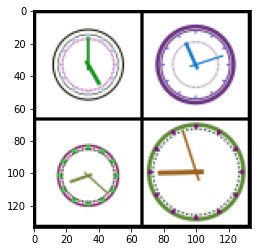

Text(0.5, 1.0, 'Re-Reals..0.072')

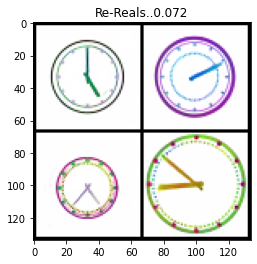

In [8]:
transform=transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Resize(opt.fineSize),
                                transforms.CenterCrop(opt.fineSize),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                            ])
reals = []
for i in range(4):
    reals.append( transform(getRandomClock(randSeed=i)[0].copy()))
reals = torch.stack(reals).cuda(gpu)
if ntbk:
    plt.imshow(vutils.make_grid(
            reals.detach().cpu(),
            padding = 2, nrow = 2, normalize = True
        ).numpy().transpose([1, 2, 0]))
    plt.show()

izl = inverseZL(reals) 
re_reals = G(izl, None if opt.getZ else izl)[1]
plt.imshow(vutils.make_grid(
     re_reals.detach().cpu(),
    padding = 2, nrow = 2, normalize = True
).numpy().transpose([1, 2, 0]))
plt.title("Re-Reals..{:.3f}".format(mse(reals, re_reals)))

In [9]:
#Now create the architecture which will modify the z
class decoupleZ(nn.Module):
    """
    This will be bunch of FCs to do the job.
    z1 --FCs---> h1_m1_, Style <==> h2_m2_, Style ----> z2
    
    """
    def __init__(self):
        super(decoupleZ, self).__init__()
        global opt
        if opt.getZ:
            st_size = opt.nz
        else:
            st_size = 4*4*8*opt.dim
        #self.fc = nn.Linear(st_size, st_size)
        #LSeq = [st_size, st_size, st_size, int(0.8*st_size)]
        #LSeq = [st_size, opt.nz, int(0.8*opt.nz)]
        LSeq = [st_size + 72, st_size, st_size]
        self.Enc = nn.Sequential()
        for i in range(1, len(LSeq)-1):
            LinL = nn.Linear(LSeq[i-1], LSeq[i])
            self.Enc.add_module("EncLin_"+str(i), LinL)
            NLinL = nn.ReLU()
            self.Enc.add_module("EncNLin_"+str(i), NLinL)
        #Now, we'll split the Enc o/p to style, h and m
        EncLinFinal = nn.Linear(LSeq[-2], LSeq[-1])
        self.Enc.add_module("EncLin_"+str(len(LSeq)-1), EncLinFinal)
        #
    def forward(self, z1, h2, m2):
        return self.Enc(torch.cat([z1, h2, m2], axis=1))

dCopZ = decoupleZ().cuda(gpu)
dCopZ

decoupleZ(
  (Enc): Sequential(
    (EncLin_1): Linear(in_features=172, out_features=100, bias=True)
    (EncNLin_1): ReLU()
    (EncLin_2): Linear(in_features=100, out_features=100, bias=True)
  )
)

In [10]:
opt.niter

10000

 Loss 0.218: 100%|██████████| 100/100 [00:07<00:00, 13.91it/s]


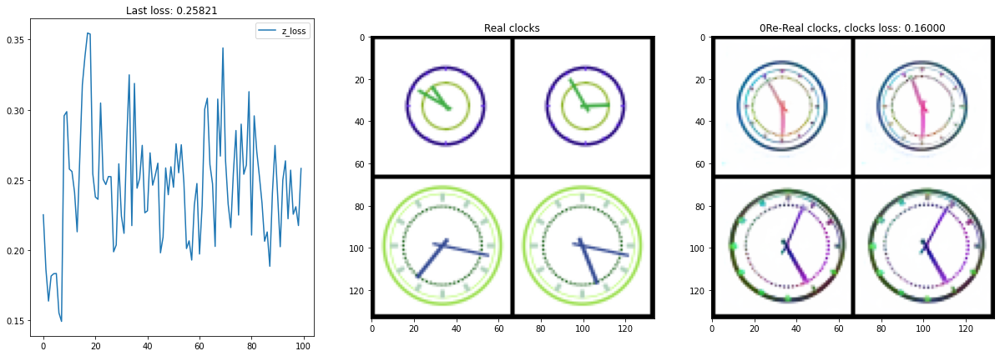

 Loss 0.229: 100%|██████████| 100/100 [00:07<00:00, 13.53it/s]


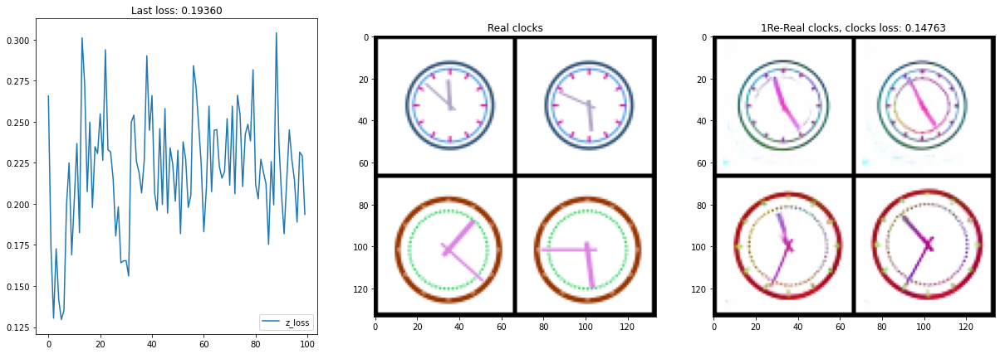

 Loss 0.195: 100%|██████████| 100/100 [00:07<00:00, 13.31it/s]


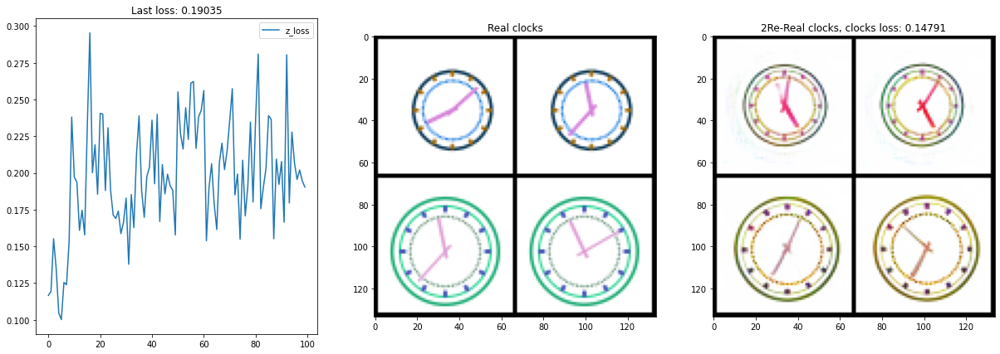

 Loss 0.188: 100%|██████████| 100/100 [00:07<00:00, 13.73it/s]


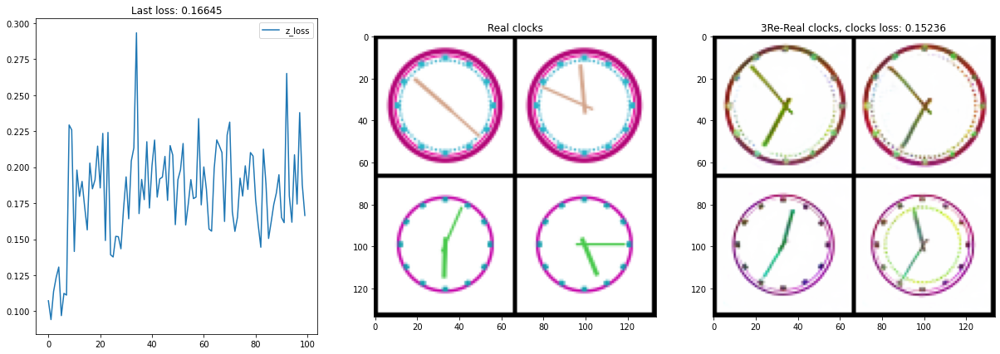

 Loss 0.223: 100%|██████████| 100/100 [00:07<00:00, 13.38it/s]


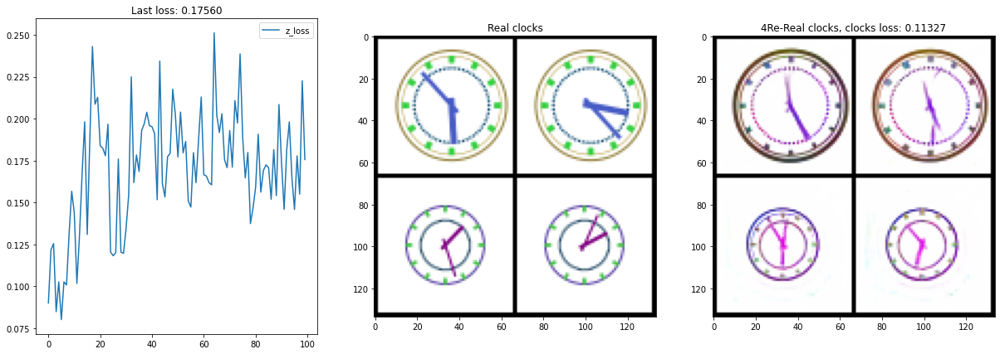

 Loss 0.155: 100%|██████████| 100/100 [00:07<00:00, 14.00it/s]


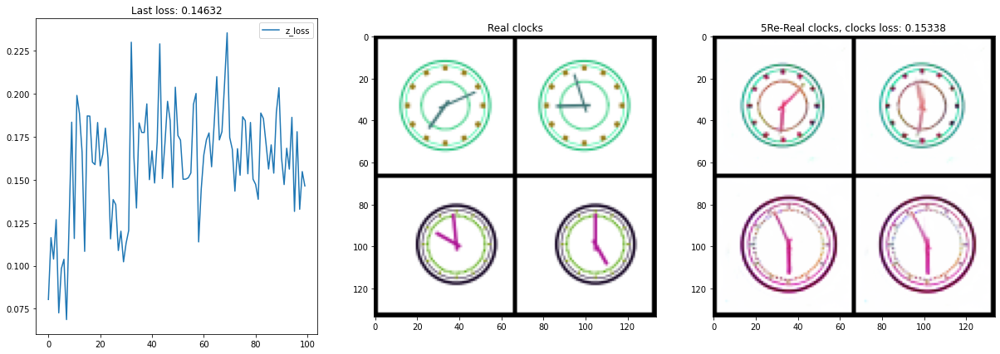

 Loss 0.146: 100%|██████████| 100/100 [00:07<00:00, 13.93it/s]


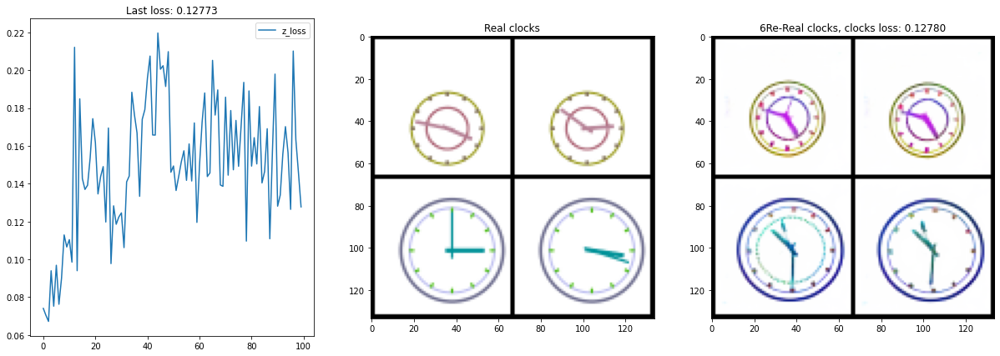

 Loss 0.148: 100%|██████████| 100/100 [00:07<00:00, 13.71it/s]


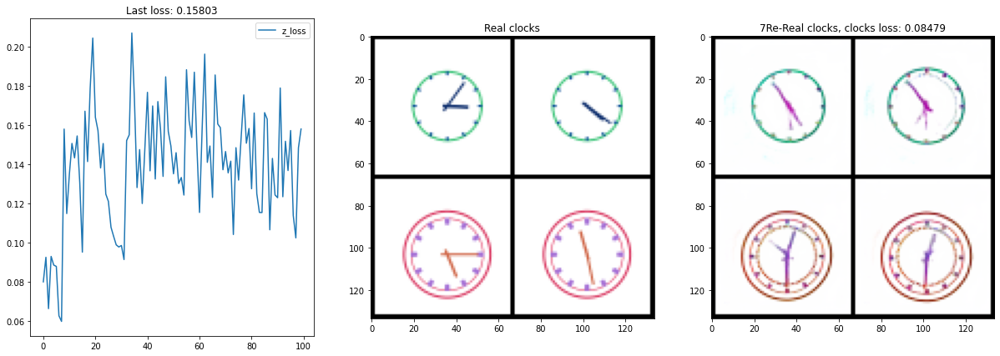

 Loss 0.177: 100%|██████████| 100/100 [00:07<00:00, 12.69it/s]


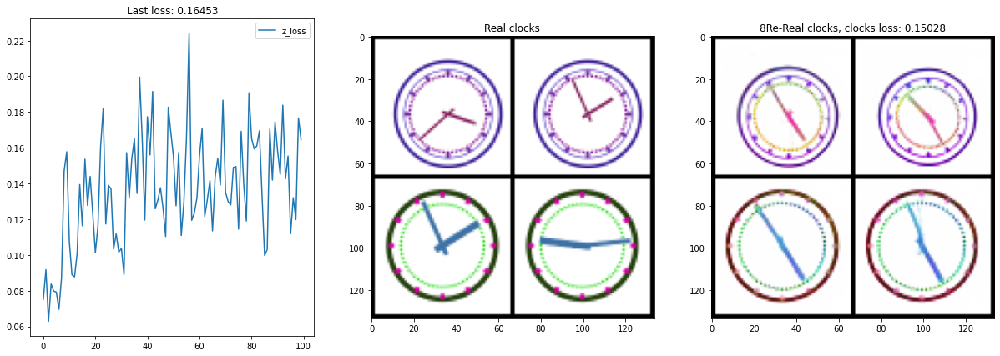

 Loss 0.132: 100%|██████████| 100/100 [00:07<00:00, 13.15it/s]


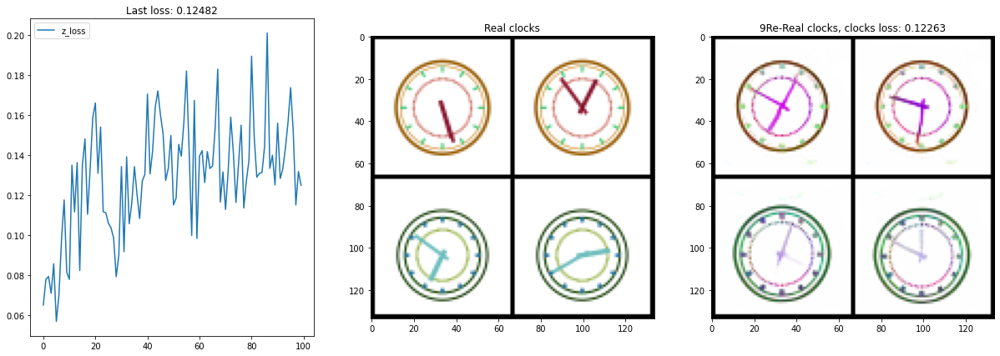

 Loss 0.051: 100%|██████████| 10000/10000 [15:02<00:00, 11.08it/s]


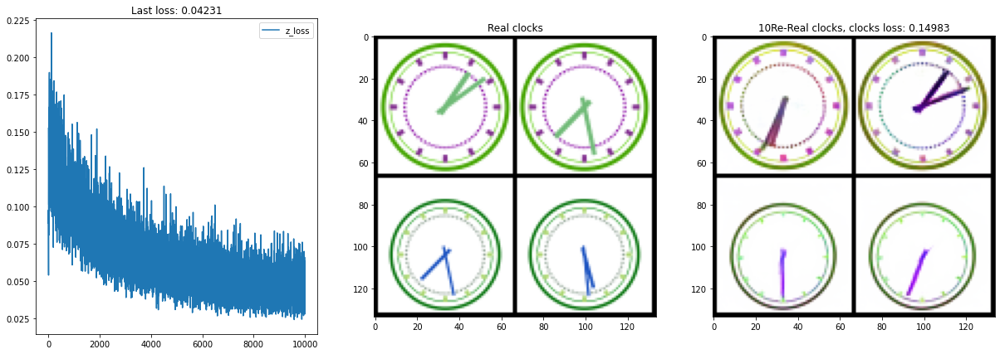

 Loss 0.057: 100%|██████████| 10000/10000 [14:58<00:00, 11.13it/s]


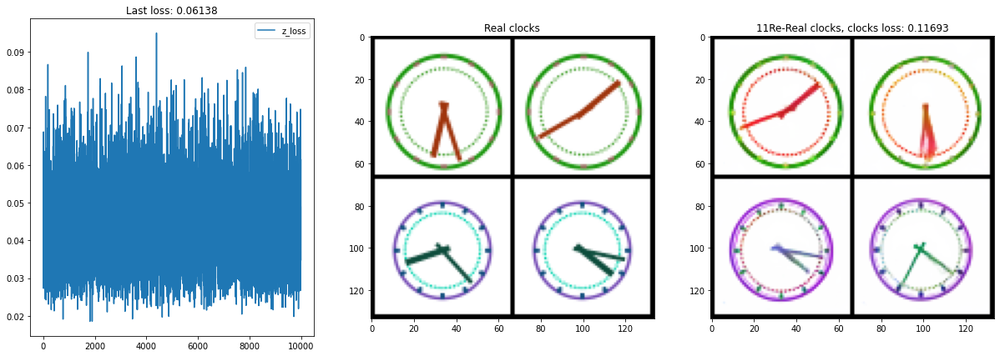

 Loss 0.027: 100%|██████████| 10000/10000 [15:01<00:00, 11.10it/s]


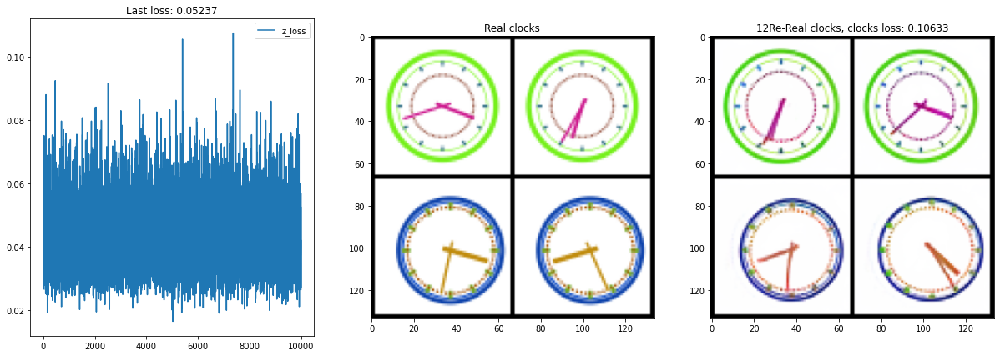

 Loss 0.040: 100%|██████████| 10000/10000 [15:06<00:00, 11.03it/s]


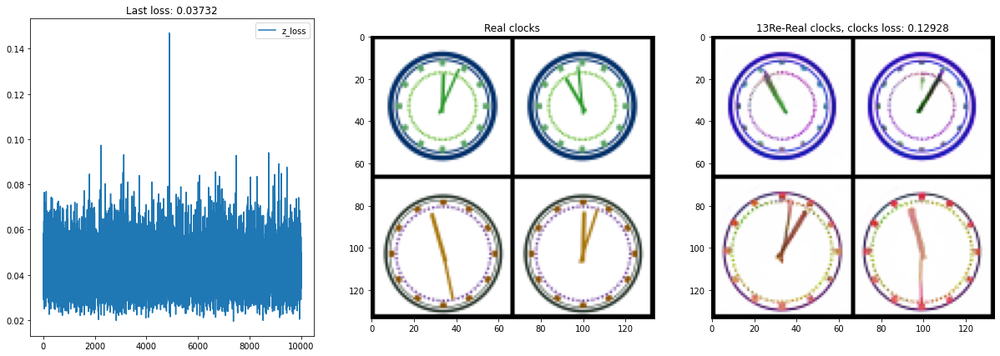

 Loss 0.057: 100%|██████████| 10000/10000 [15:01<00:00, 11.09it/s]


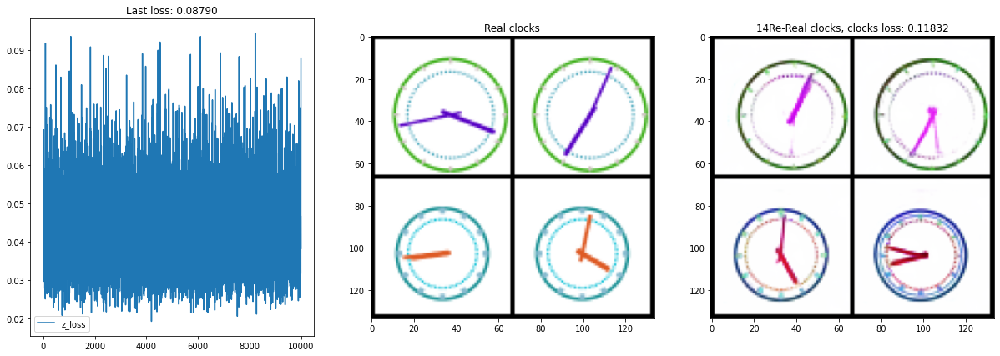

 Loss 0.042: 100%|██████████| 10000/10000 [15:07<00:00, 11.01it/s]


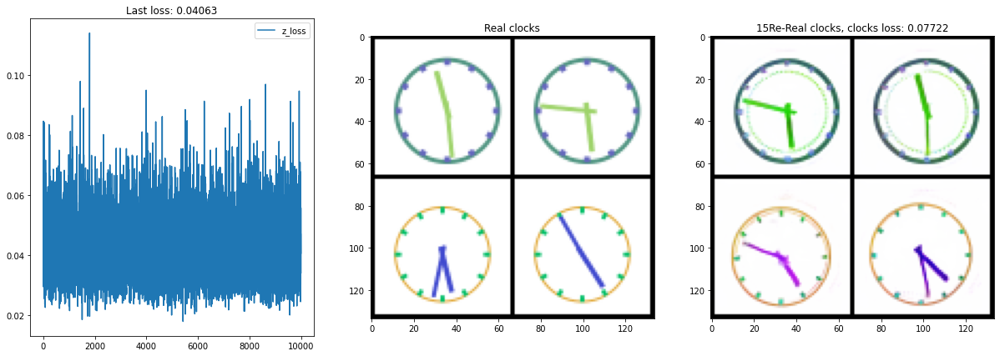

 Loss 0.047: 100%|██████████| 10000/10000 [15:07<00:00, 11.02it/s]


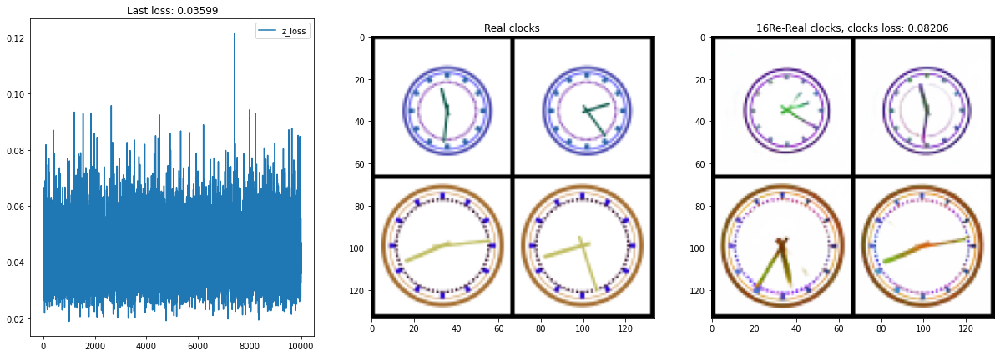

 Loss 0.038: 100%|██████████| 10000/10000 [15:04<00:00, 11.06it/s]


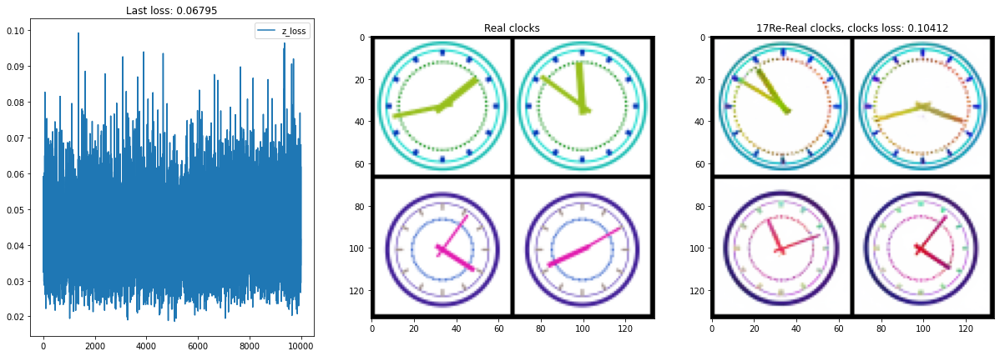

 Loss 0.038: 100%|██████████| 10000/10000 [15:08<00:00, 11.00it/s]


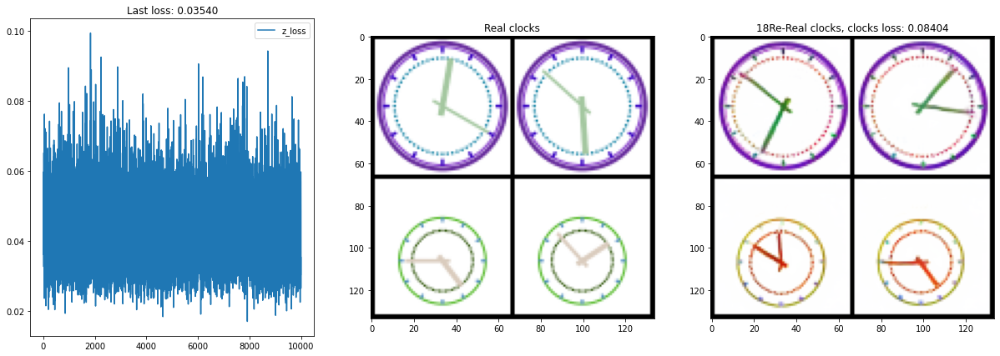

 Loss 0.033: 100%|██████████| 10000/10000 [15:04<00:00, 11.06it/s]


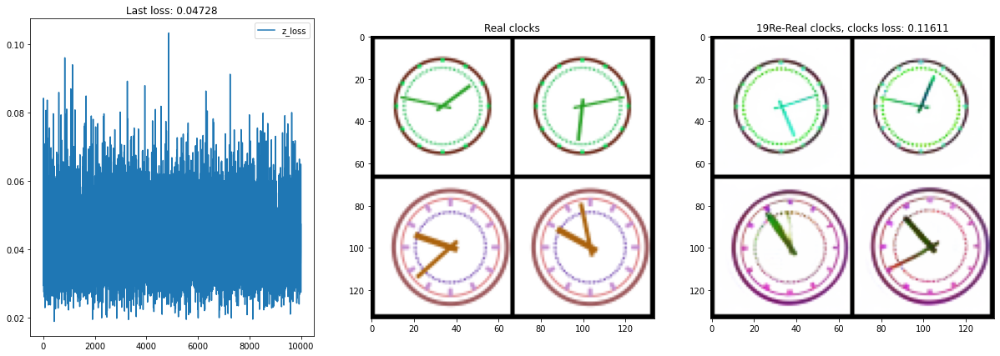

 Loss 0.039: 100%|██████████| 10000/10000 [15:09<00:00, 11.00it/s]


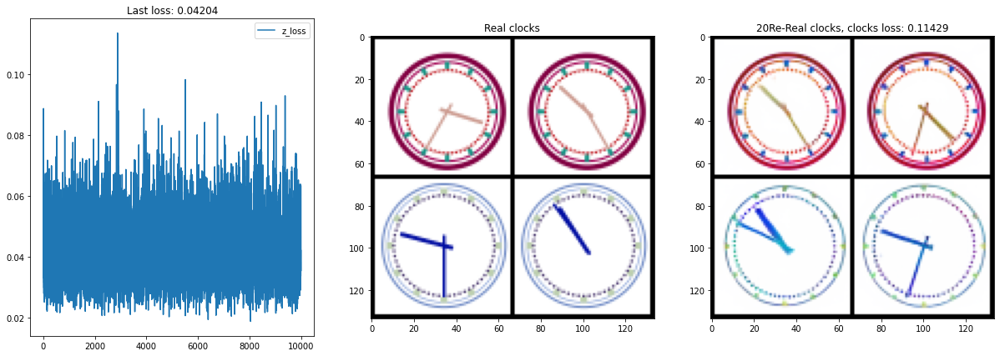

 Loss 0.037: 100%|██████████| 10000/10000 [15:08<00:00, 11.00it/s]


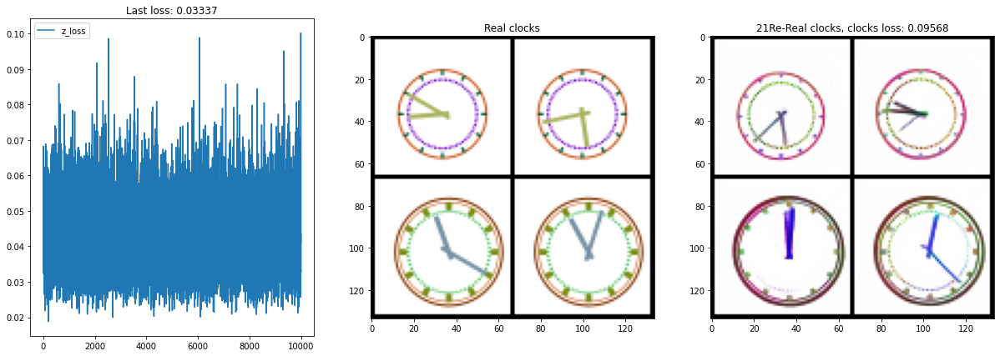

 Loss 0.043: 100%|██████████| 10000/10000 [15:05<00:00, 11.04it/s]


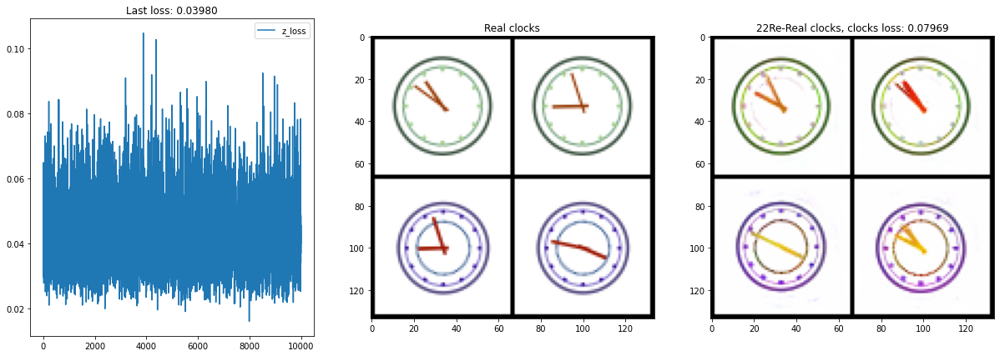

 Loss 0.021: 100%|██████████| 10000/10000 [15:05<00:00, 11.04it/s]


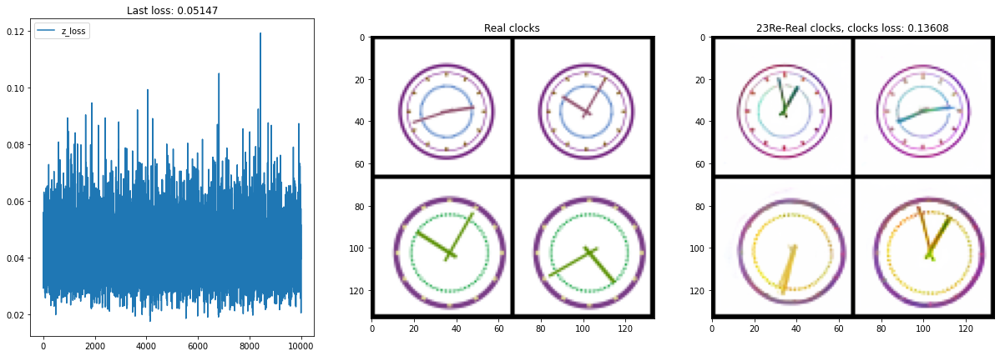

 Loss 0.052: 100%|██████████| 10000/10000 [15:10<00:00, 10.99it/s]


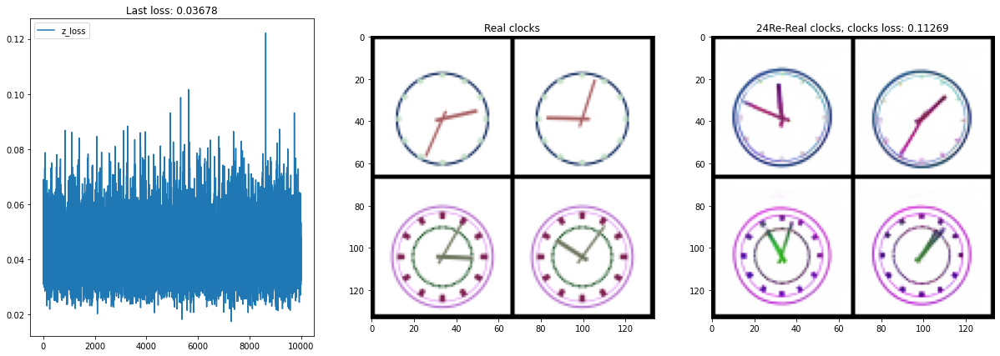

 Loss 0.035: 100%|██████████| 10000/10000 [15:11<00:00, 10.97it/s]


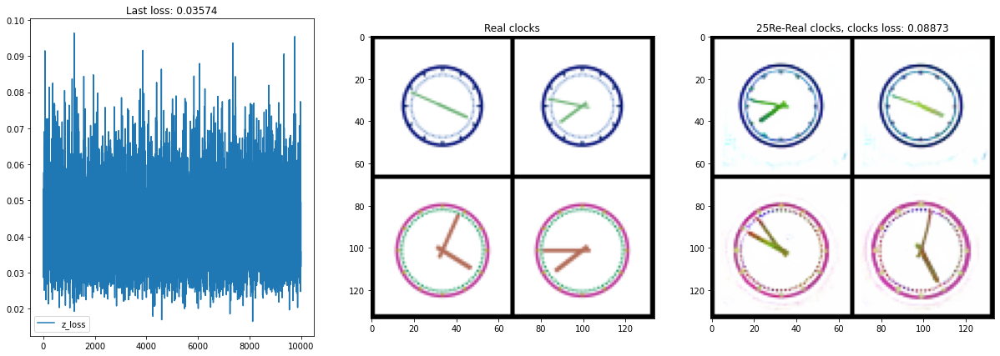

 Loss 0.036: 100%|██████████| 10000/10000 [15:11<00:00, 10.98it/s]


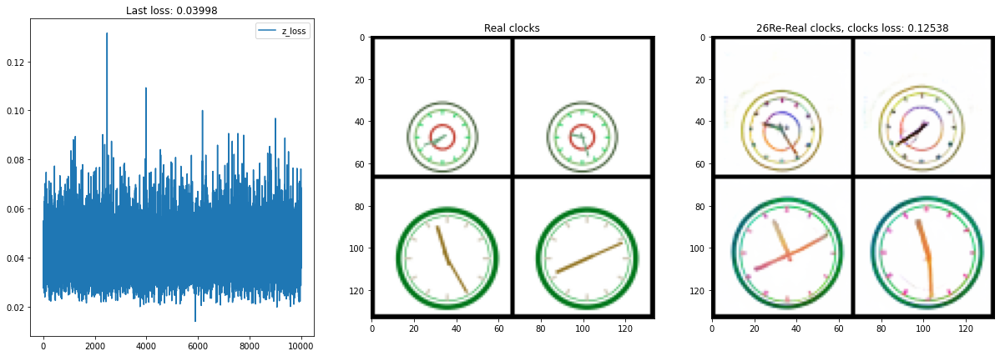

 Loss 0.050: 100%|██████████| 10000/10000 [15:08<00:00, 11.01it/s]


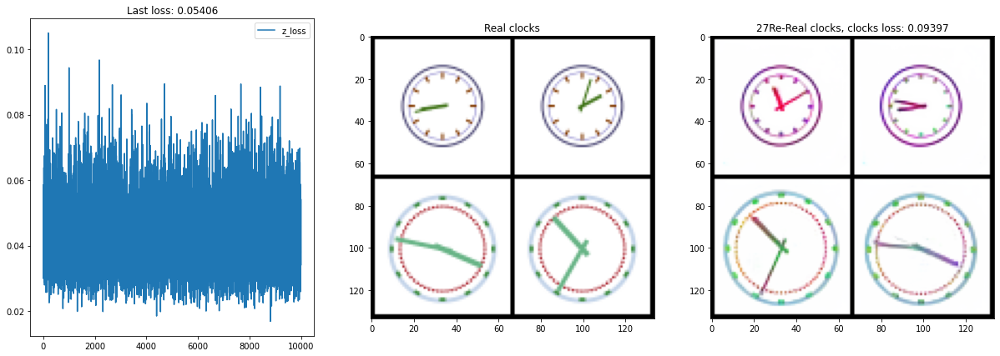

 Loss 0.041: 100%|██████████| 10000/10000 [15:09<00:00, 10.99it/s]


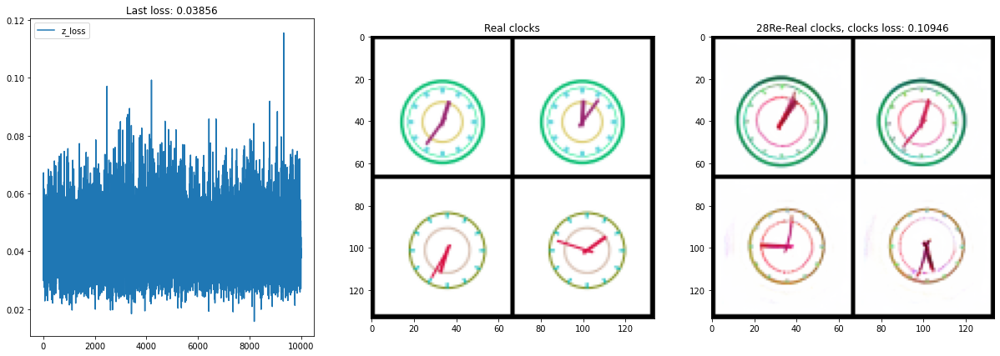

 Loss 0.044: 100%|██████████| 10000/10000 [15:08<00:00, 11.01it/s]


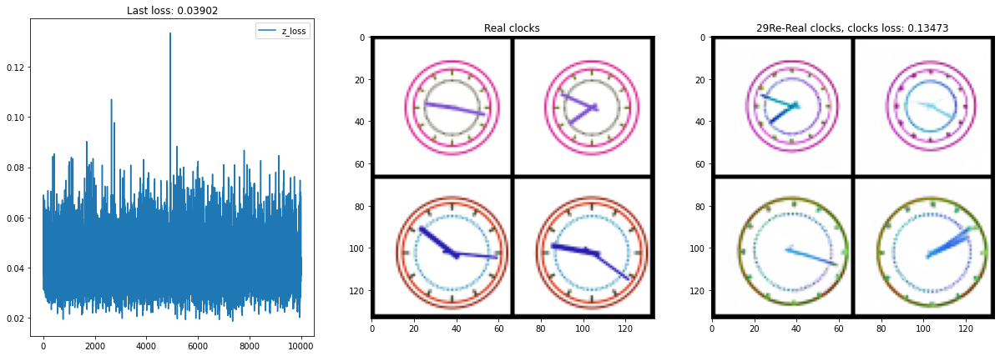

 Loss 0.045: 100%|██████████| 10000/10000 [15:10<00:00, 10.99it/s]


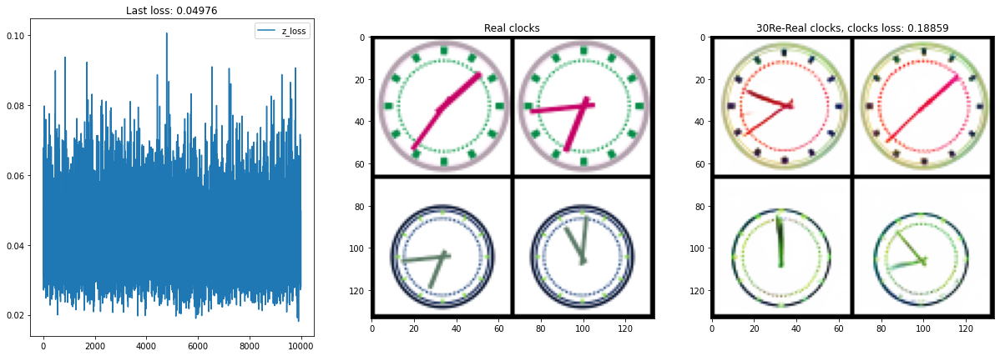

 Loss 0.043: 100%|██████████| 10000/10000 [15:12<00:00, 10.96it/s]


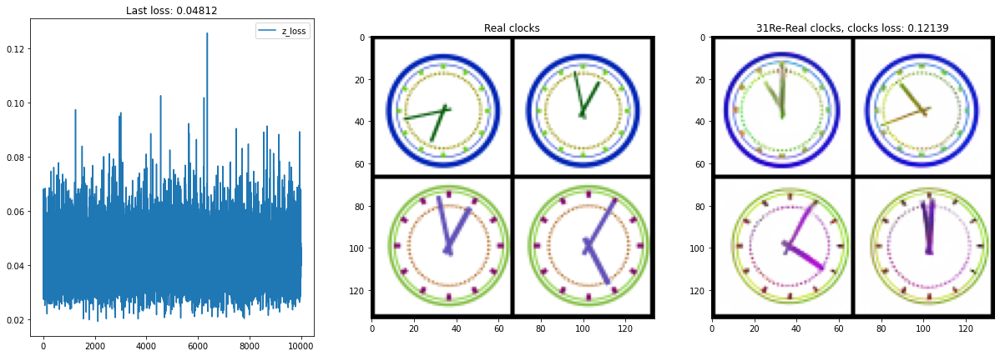

 Loss 0.045: 100%|██████████| 10000/10000 [15:09<00:00, 10.99it/s]


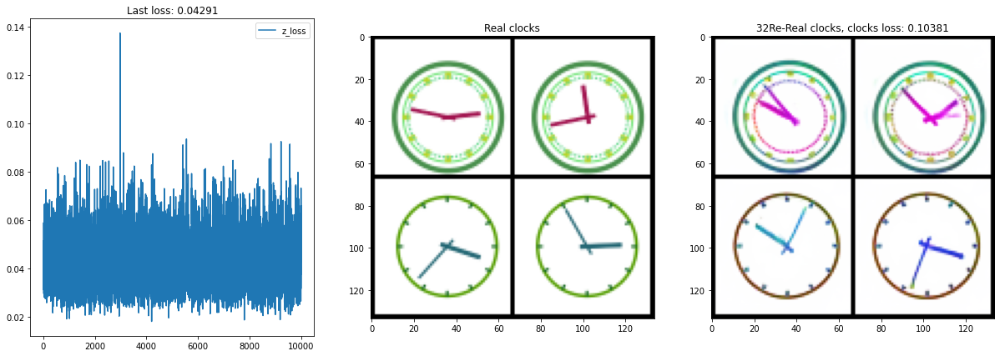

 Loss 0.043: 100%|██████████| 10000/10000 [15:05<00:00, 11.04it/s]


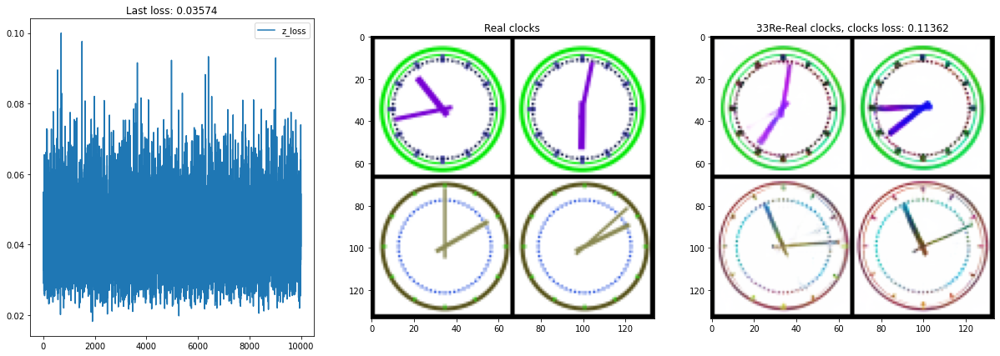

 Loss 0.052: 100%|██████████| 10000/10000 [15:09<00:00, 10.99it/s]


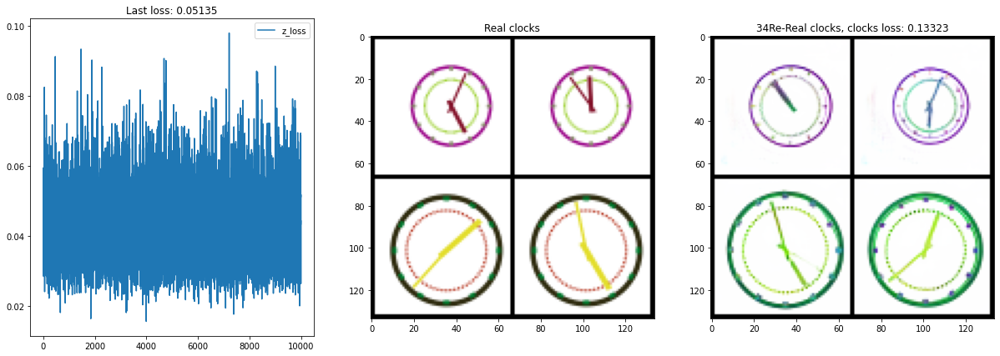

 Loss 0.049: 100%|██████████| 10000/10000 [15:06<00:00, 11.04it/s]


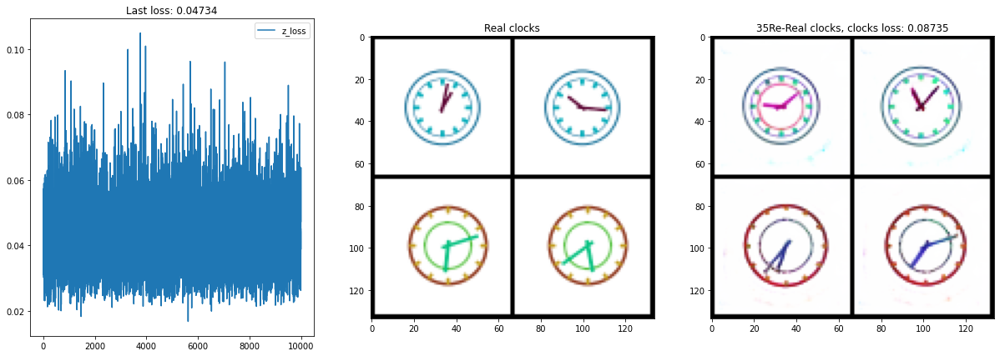

 Loss 0.041: 100%|██████████| 10000/10000 [15:06<00:00, 11.03it/s]


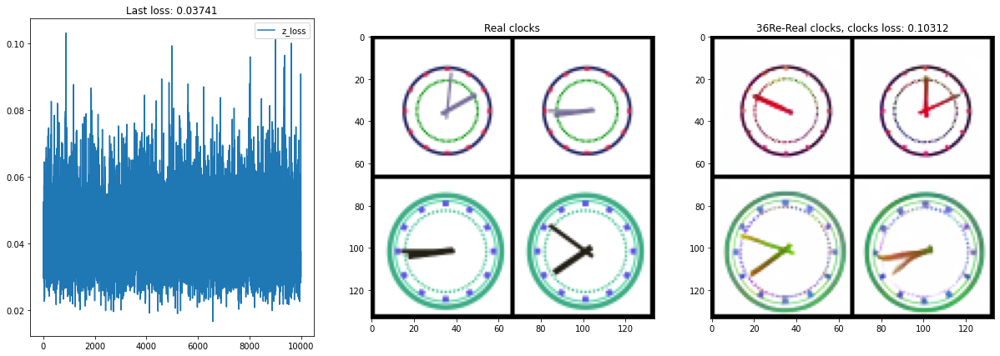

 Loss 0.050: 100%|██████████| 10000/10000 [15:10<00:00, 10.98it/s]


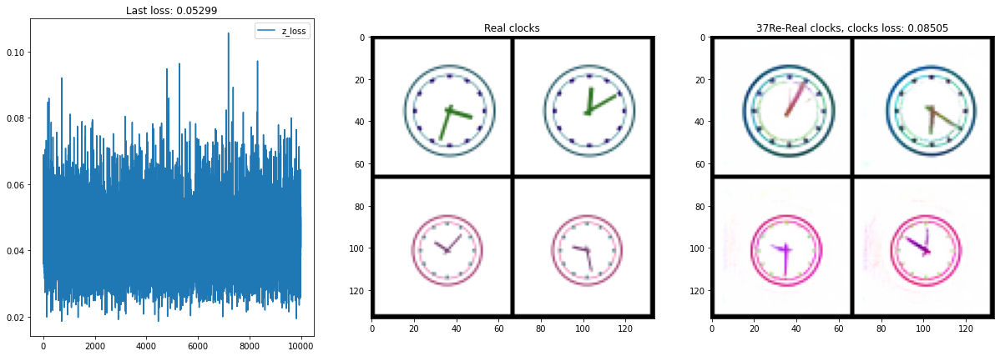

 Loss 0.042: 100%|██████████| 10000/10000 [15:09<00:00, 11.00it/s]


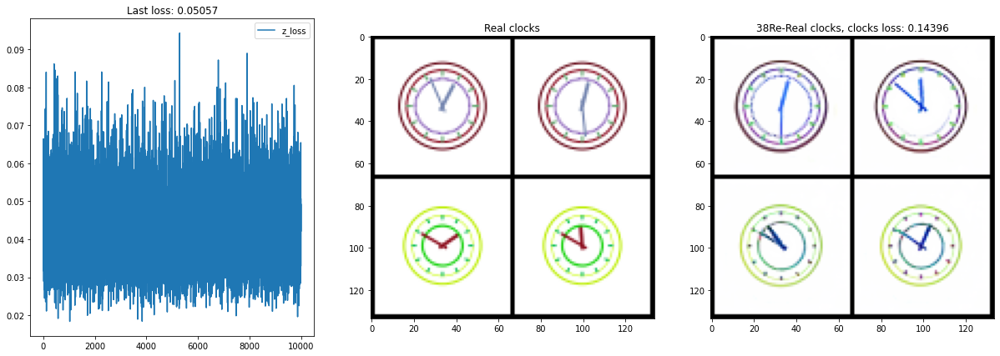

 Loss 0.038: 100%|██████████| 10000/10000 [15:01<00:00, 11.09it/s]


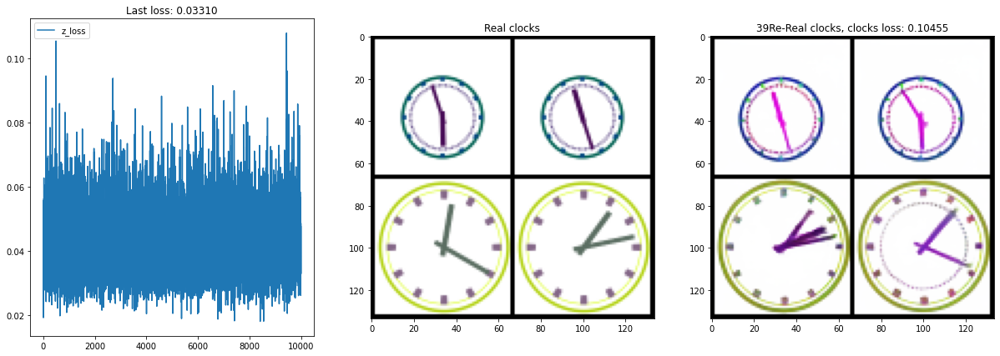

 Loss 0.033: 100%|██████████| 10000/10000 [15:06<00:00, 11.03it/s]


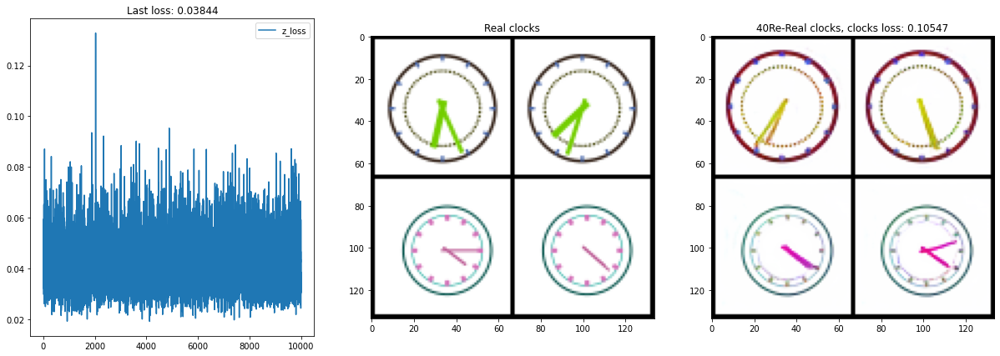

 Loss 0.041: 100%|██████████| 10000/10000 [15:05<00:00, 11.05it/s]


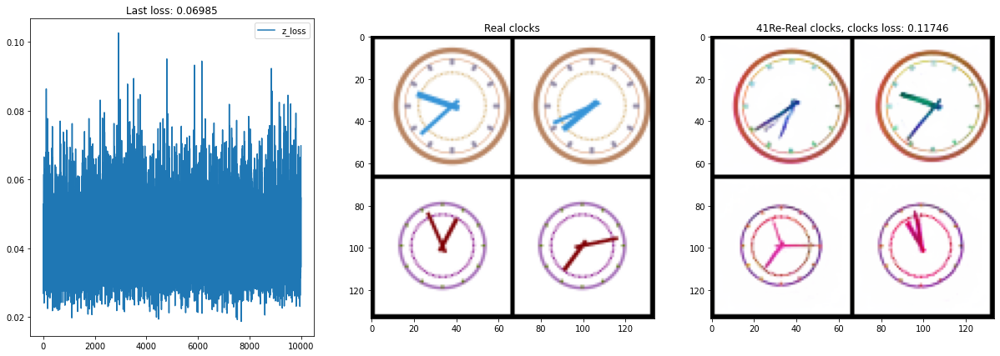

 Loss 0.026: 100%|██████████| 10000/10000 [15:08<00:00, 11.01it/s]


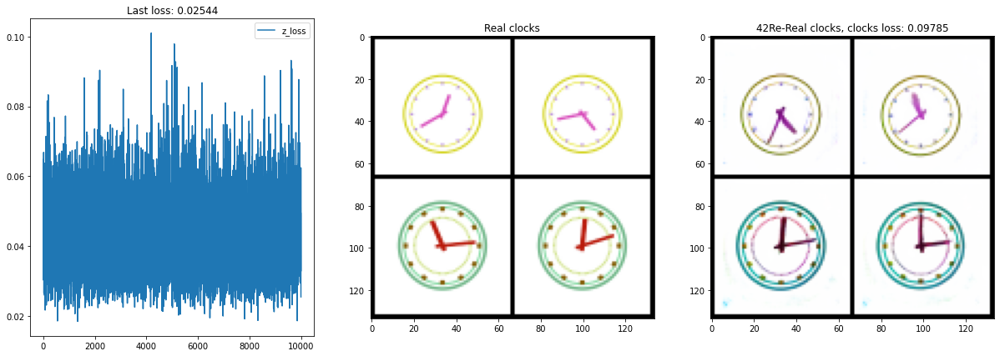

 Loss 0.037: 100%|██████████| 10000/10000 [15:04<00:00, 11.05it/s]


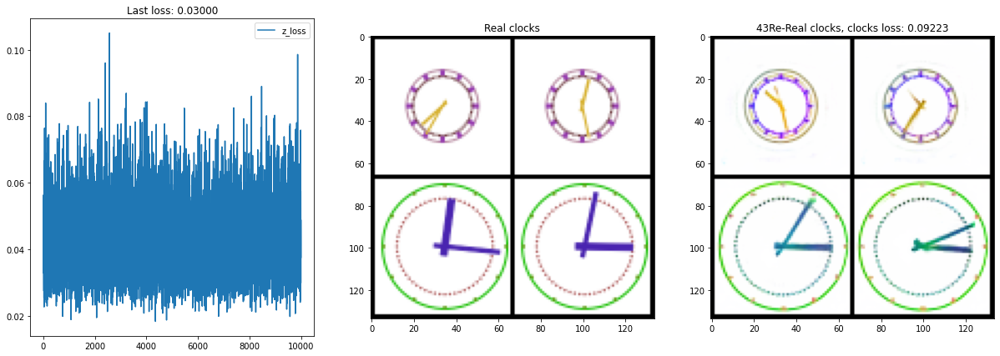

 Loss 0.040: 100%|██████████| 10000/10000 [15:09<00:00, 11.00it/s]


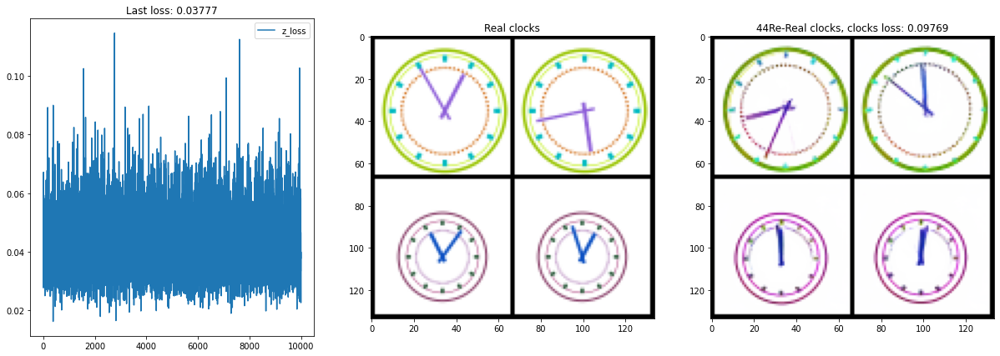

 Loss 0.038: 100%|██████████| 10000/10000 [15:06<00:00, 11.03it/s]


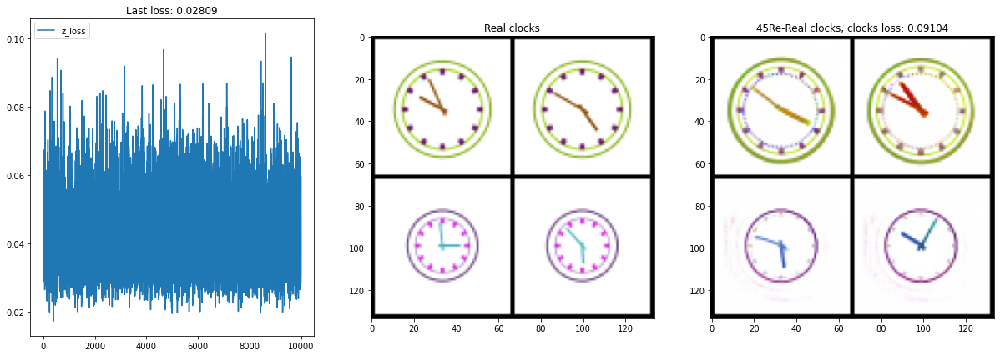

 Loss 0.042: 100%|██████████| 10000/10000 [15:10<00:00, 10.98it/s]


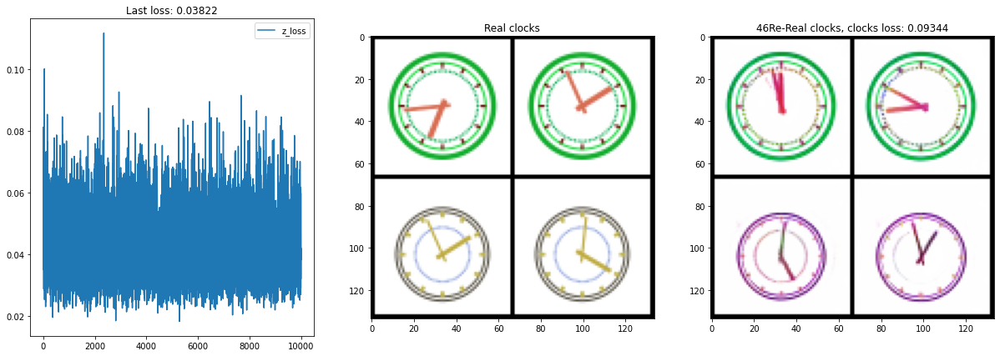

 Loss 0.034: 100%|██████████| 10000/10000 [15:15<00:00, 10.93it/s]


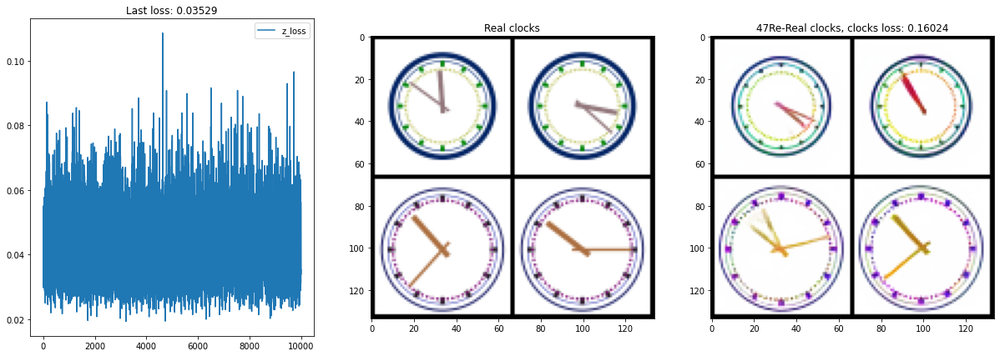

 Loss 0.040: 100%|██████████| 10000/10000 [15:06<00:00, 11.03it/s]


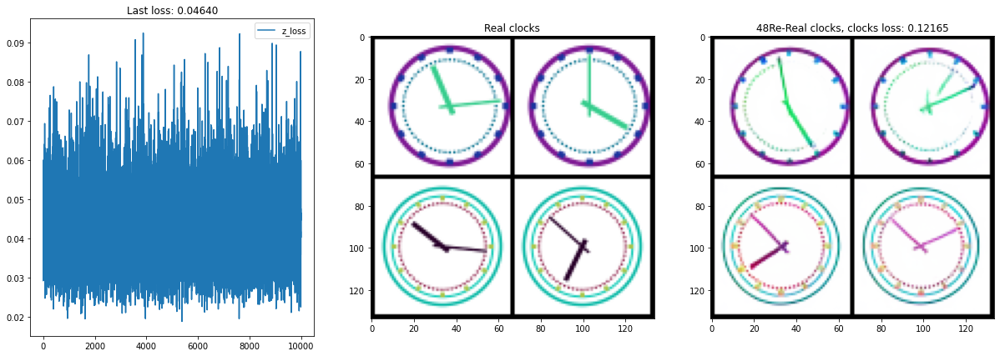

 Loss 0.027: 100%|██████████| 10000/10000 [15:12<00:00, 10.96it/s]


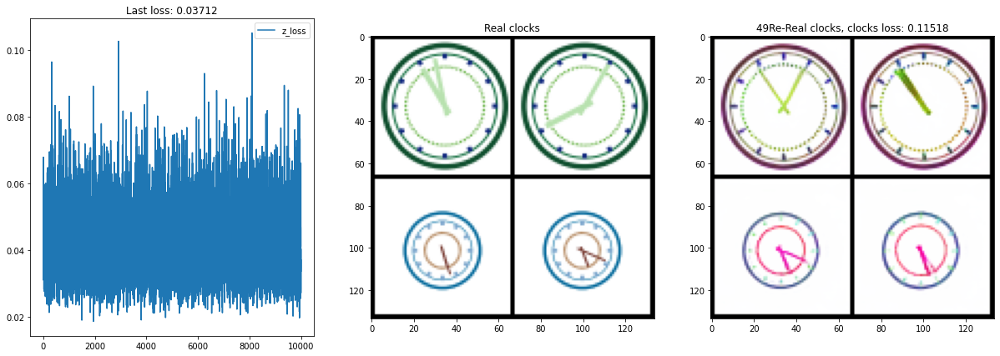

 Loss 0.035:  48%|████▊     | 4799/10000 [07:16<07:50, 11.06it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.027:  31%|███       | 3116/10000 [04:43<09:32, 12.02it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.043: 100%|██████████| 10000/10000 [15:05<00:00, 11.04it/s]


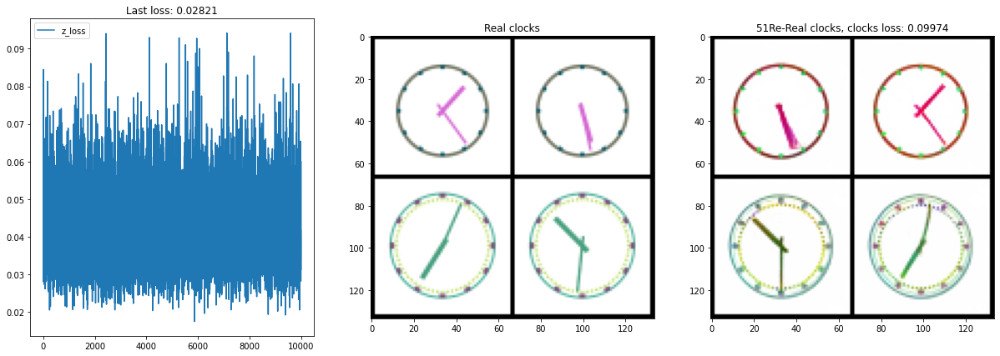

 Loss 0.044:   2%|▏         | 171/10000 [00:16<17:40,  9.27it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.052:  83%|████████▎ | 8349/10000 [12:36<01:47, 15.36it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.047:  65%|██████▍   | 6473/10000 [09:42<04:39, 12.60it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set

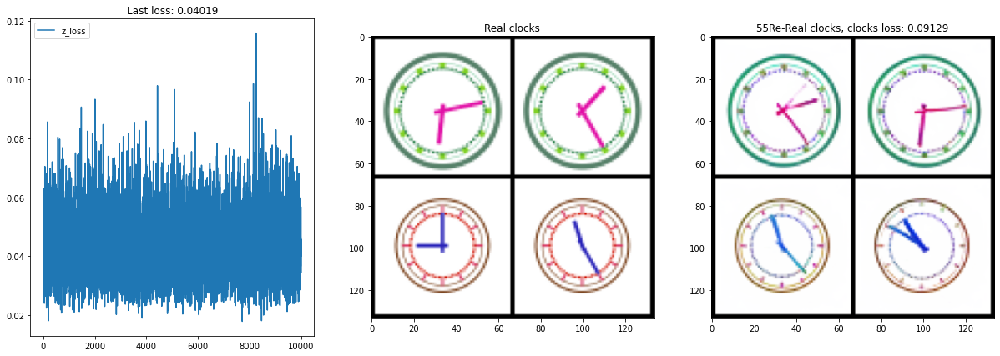

 Loss 0.076:   6%|▌         | 607/10000 [00:55<14:41, 10.66it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.029:  53%|█████▎    | 5316/10000 [08:02<05:24, 14.45it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.051:  83%|████████▎ | 8299/10000 [12:34<02:24, 11.75it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set

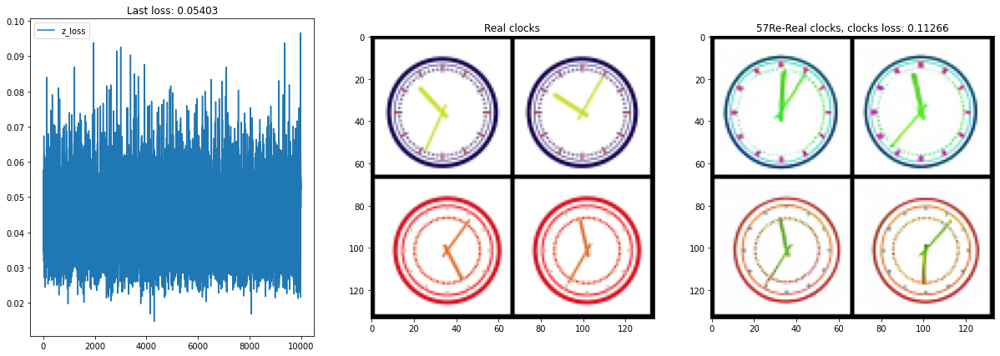

 Loss 0.041:   8%|▊         | 845/10000 [01:20<17:38,  8.65it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.041:  38%|███▊      | 3835/10000 [05:58<07:04, 14.52it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 Loss 0.053: 100%|██████████| 10000/10000 [15:31<00:00, 10.74it/s]


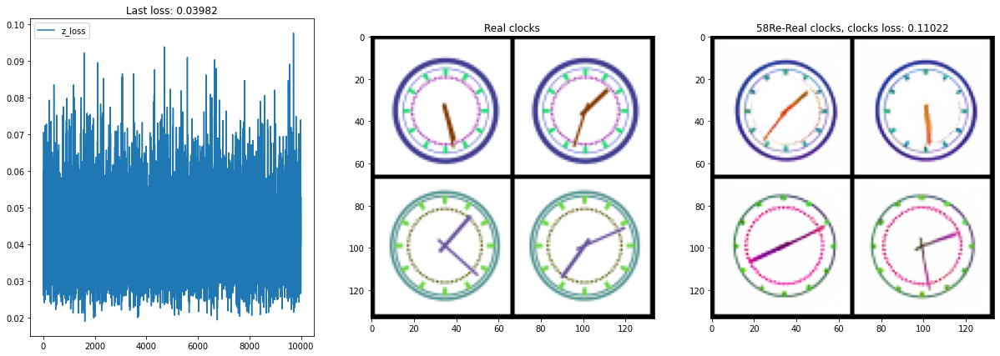

 Loss 0.050: 100%|██████████| 10000/10000 [15:24<00:00, 10.81it/s]


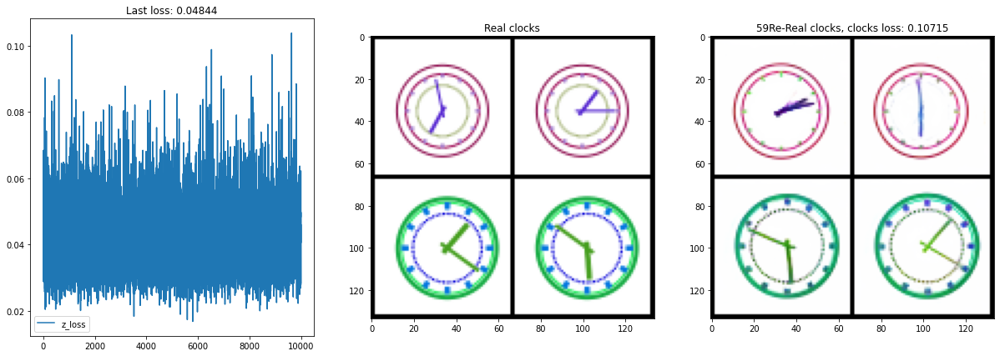

 Loss 0.037: 100%|██████████| 10000/10000 [15:23<00:00, 10.83it/s]


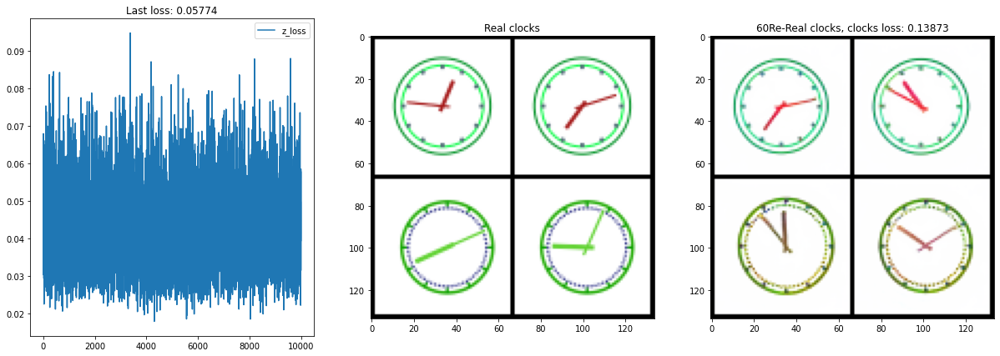

 Loss 0.041: 100%|██████████| 10000/10000 [15:14<00:00, 10.93it/s]


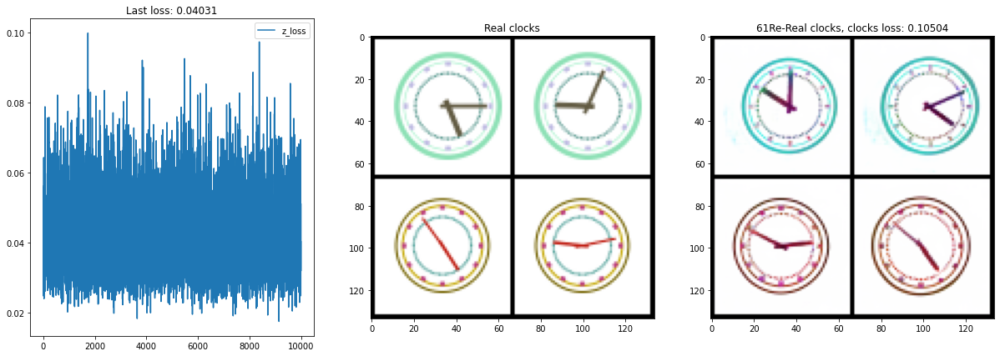

 Loss 0.042: 100%|██████████| 10000/10000 [15:21<00:00, 10.86it/s]


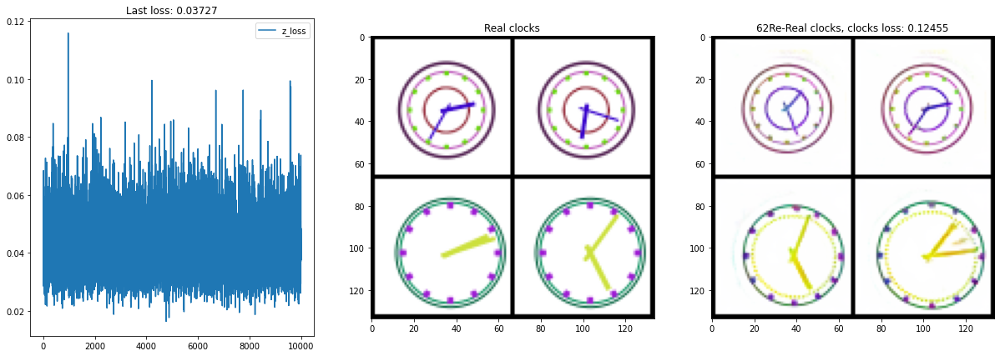

 Loss 0.037: 100%|██████████| 10000/10000 [15:29<00:00, 10.76it/s]


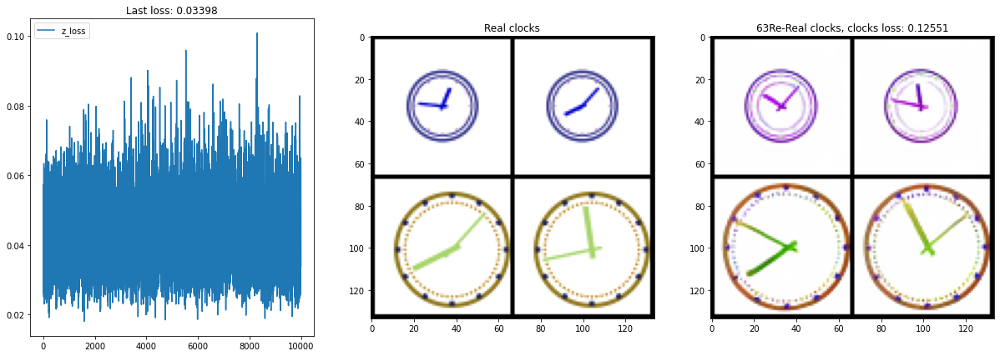

 Loss 0.049: 100%|██████████| 10000/10000 [15:25<00:00, 10.81it/s]


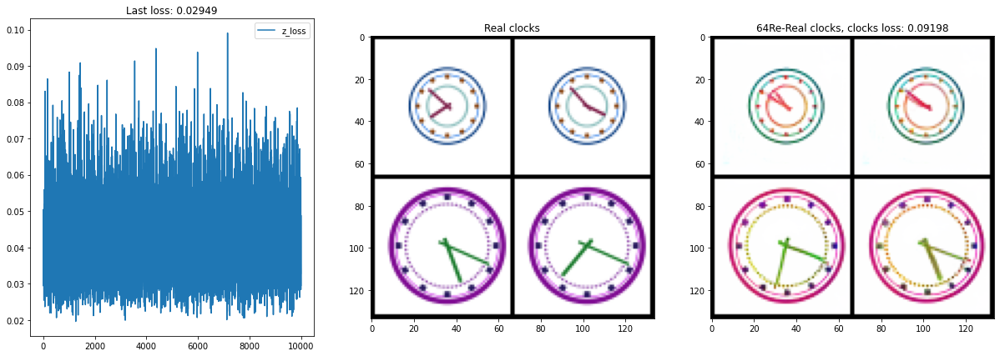

 Loss 0.042: 100%|██████████| 10000/10000 [15:26<00:00, 10.79it/s]


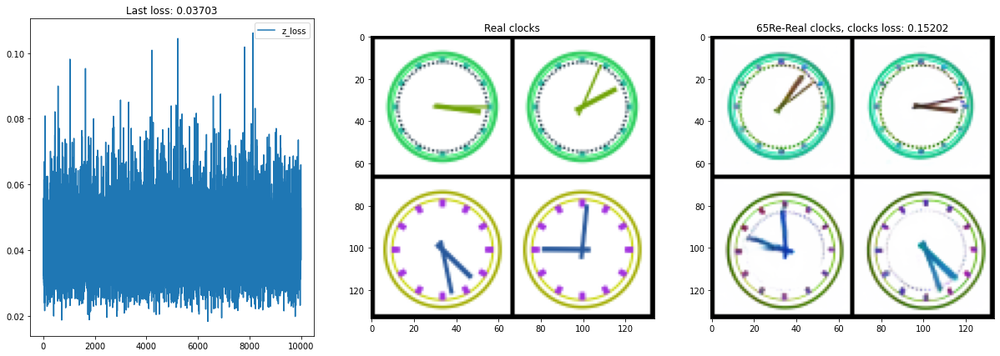

 Loss 0.054: 100%|██████████| 10000/10000 [15:12<00:00, 10.95it/s]


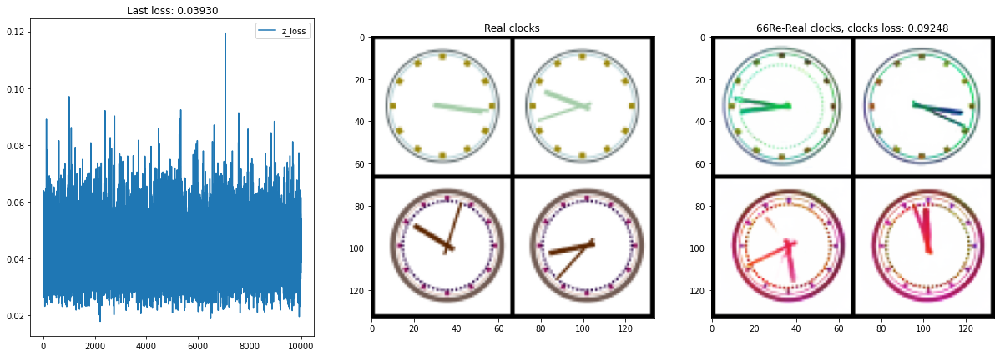

 Loss 0.042: 100%|██████████| 10000/10000 [15:10<00:00, 10.99it/s]


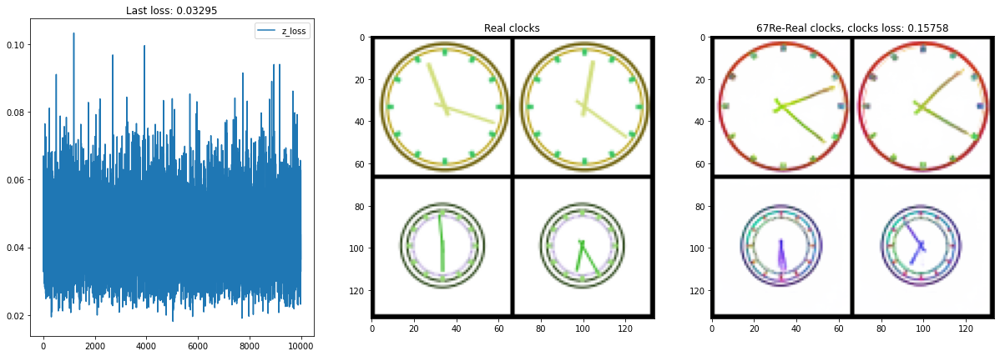

 Loss 0.036: 100%|██████████| 10000/10000 [15:15<00:00, 10.93it/s]


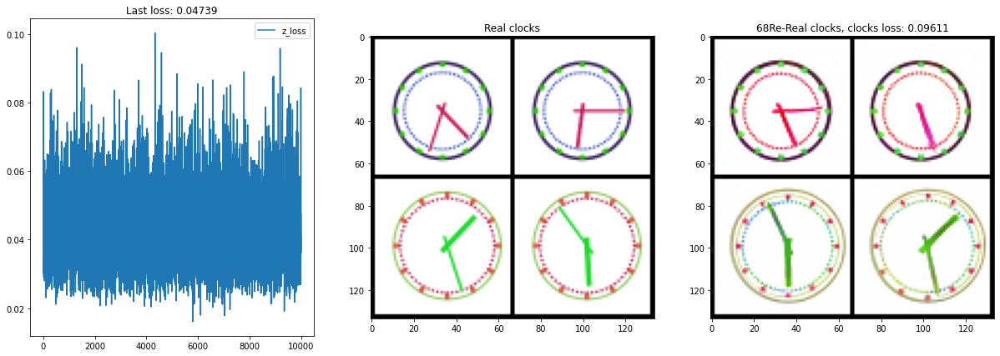

 Loss 0.050: 100%|██████████| 10000/10000 [15:29<00:00, 10.76it/s]


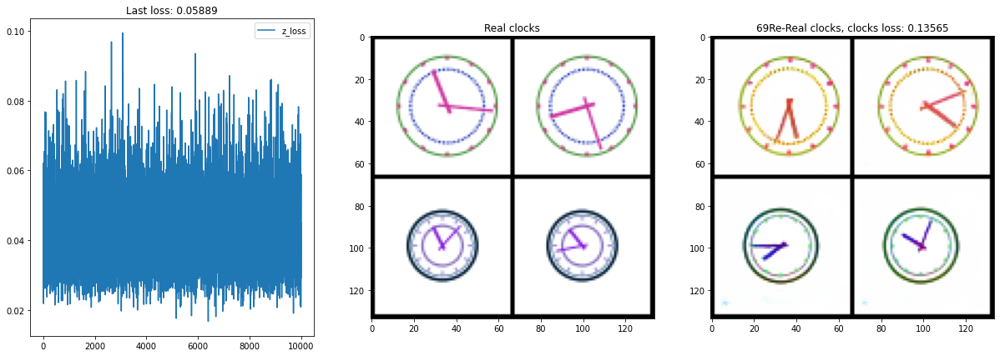

 Loss 0.039: 100%|██████████| 10000/10000 [15:25<00:00, 10.80it/s]


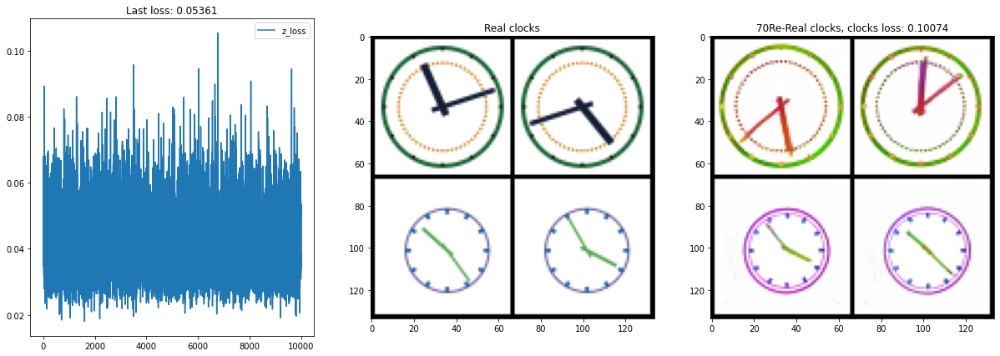

 Loss 0.080: 100%|██████████| 10000/10000 [15:28<00:00, 10.77it/s]


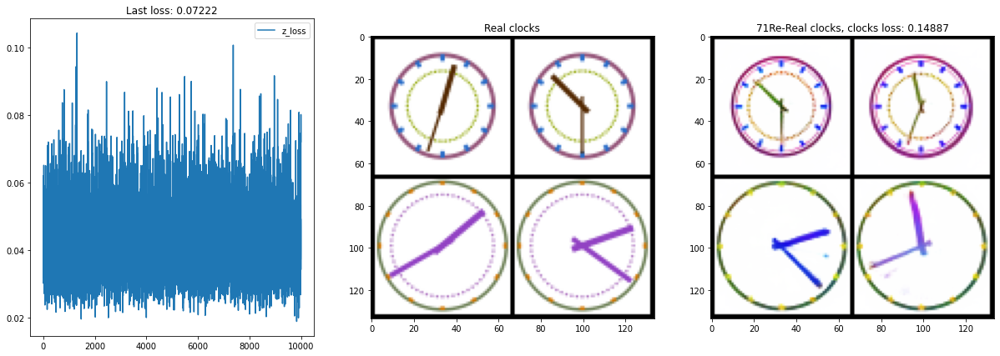

 Loss 0.051: 100%|██████████| 10000/10000 [15:22<00:00, 10.84it/s]


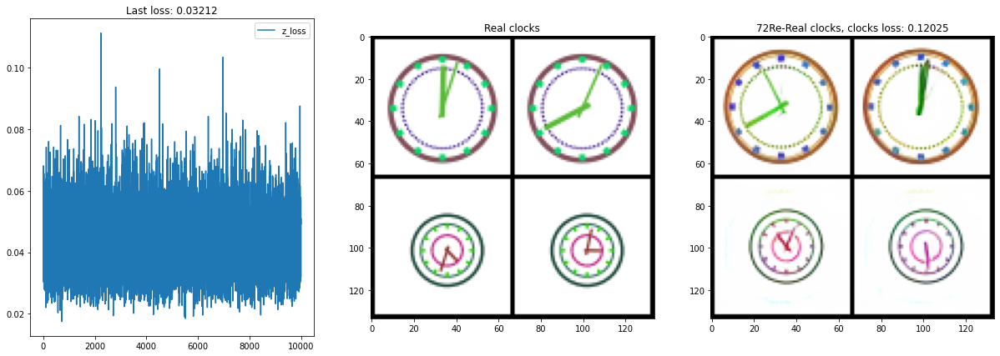

 Loss 0.059: 100%|██████████| 10000/10000 [15:21<00:00, 10.85it/s]


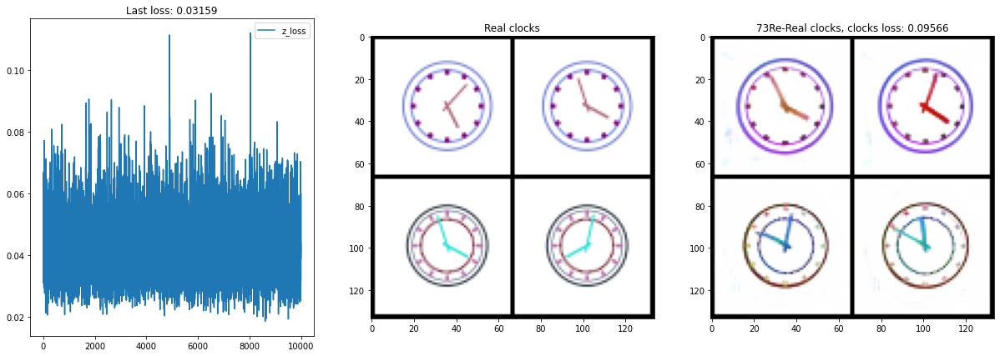

 Loss 0.030: 100%|██████████| 10000/10000 [15:22<00:00, 10.84it/s]


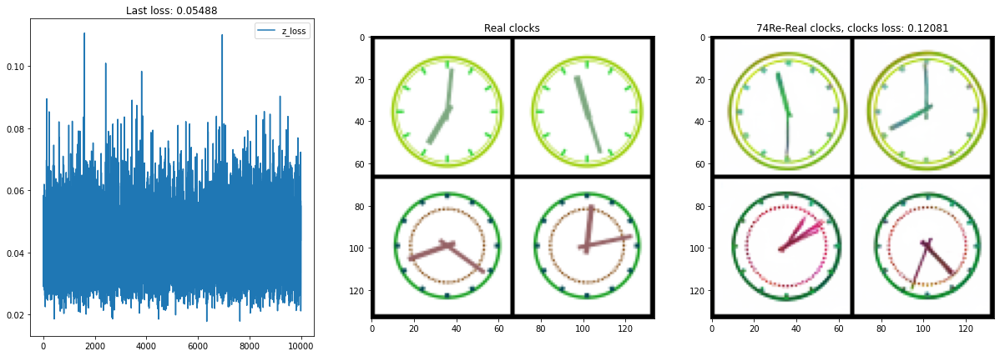

 Loss 0.042: 100%|██████████| 10000/10000 [15:05<00:00, 11.05it/s]


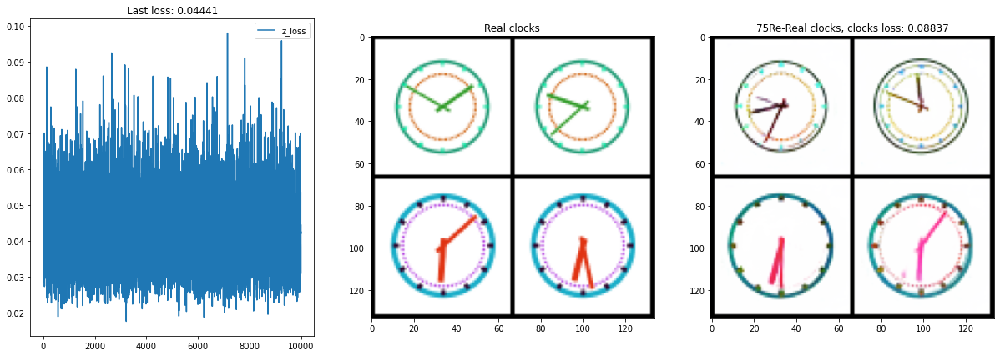

 Loss 0.029: 100%|██████████| 10000/10000 [15:22<00:00, 10.84it/s]


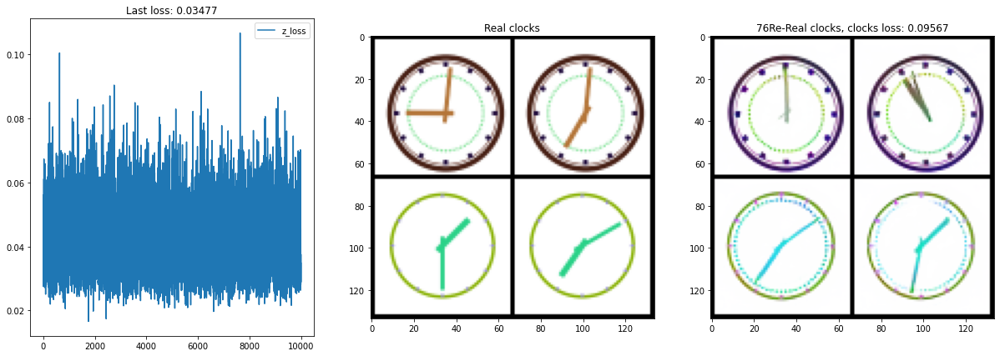

 Loss 0.039: 100%|██████████| 10000/10000 [15:23<00:00, 10.83it/s]


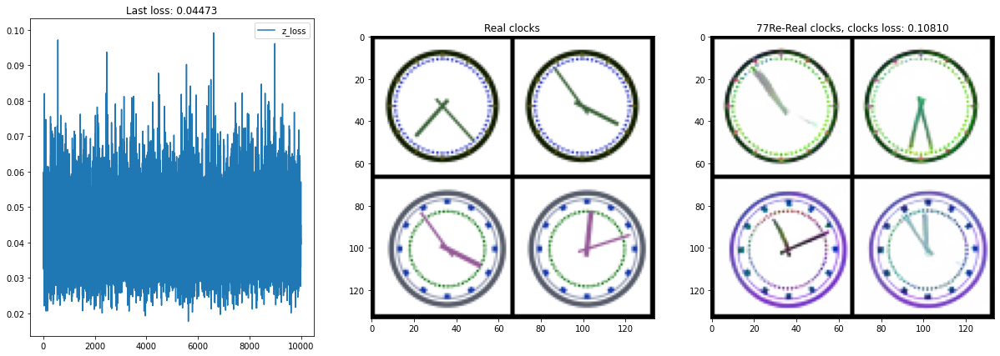

 Loss 0.041: 100%|██████████| 10000/10000 [13:35<00:00, 12.27it/s]


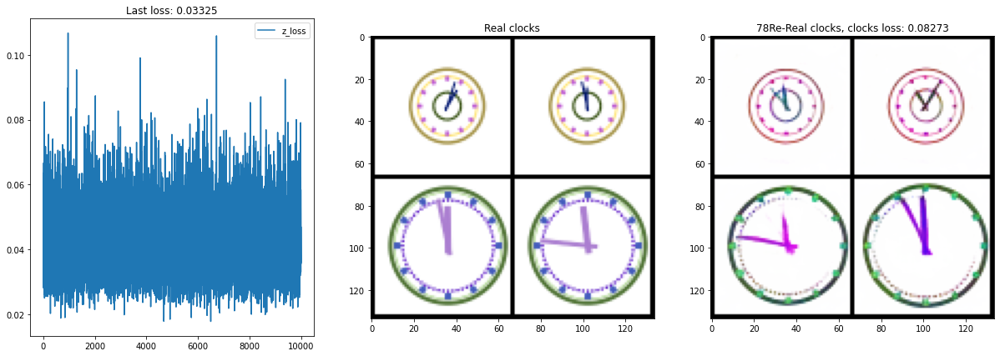

 Loss 0.040:   7%|▋         | 660/10000 [00:36<08:42, 17.86it/s]


KeyboardInterrupt: 

In [12]:
h_eye = torch.eye(12)
m_eye = torch.eye(60)
#bce = nn.BCELoss()

#opt_dz = optim.Adam(dCopZ.parameters(), 
#                        lr=opt.lrD*0.001, betas=(opt.beta1, 0.999))
opt_dz = optim.RMSprop(dCopZ.parameters(), lr = opt.lrD)

loss = 1
bce_h_loss = 0
bce_m_loss = 0
dataloader = None
for e in range(100):
    del dataloader
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=3,
                                            shuffle=True, num_workers=8)#int(opt.workers))
    data_iter = iter(dataloader)
    losses = []
    if e == 11:
        opt_dz = optim.RMSprop(dCopZ.parameters(), lr = opt.lrD*0.0001)
    pbar = tqdm(range(100 if e < 10 else opt.niter))
    for i in pbar:
        pbar.set_description(" Loss {:.3f}".format(loss))
        reals, H1, M1 = next(data_iter)
        reals = reals.reshape(-1, 3, 64, 64).cuda(gpu)
        H1 = H1.reshape(-1, 12).cuda(gpu)
        M1 = M1.reshape(-1, 60).cuda(gpu)
        with torch.no_grad():
            ZL1 = inverseZL(reals)
            ZL2 = []
            H2 = []
            M2 = []
            for j in range(0, len(ZL1), 2):
                ZL2.append(ZL1[j+1])
                ZL2.append(ZL1[j])
                H2.append(H1[j+1])
                H2.append(H1[j])
                M2.append(M1[j+1])
                M2.append(M1[j])
            ZL2 = torch.stack(ZL2).clone().cuda(gpu)
            H2 = torch.stack(H2).clone().cuda(gpu)
            M2 = torch.stack(M2).clone().cuda(gpu)
        dCopZ.zero_grad()
        zl2  = dCopZ(ZL1, H2, M2)
        loss = mse(ZL2, zl2)
        loss.backward()
        opt_dz.step()
        losses.append(float(loss))
    fig = plt.figure(figsize=(28, 7))
    gs = fig.add_gridspec(1, 4)
    axes = []
    axes.append(fig.add_subplot(gs[0, 0]))
    axes.append(fig.add_subplot(gs[0, 1]))
    axes.append(fig.add_subplot(gs[0, 2]))
    #
    axes[0].plot(losses, label='z_loss')
    axes[0].legend()
    axes[0].set_title("Last loss: {:.5f}".format(loss))
    #
    #
    axes[1].imshow(vutils.make_grid(
        reals[:4].detach().cpu(),
        padding = 2, nrow = 2, normalize = True
    ).numpy().transpose([1, 2, 0]))
    axes[1].set_title("Real clocks")
    #
    #
    with torch.no_grad():
        _, re_reals = G(zl2, None if opt.getZ else zl2)
    #
    axes[2].imshow(vutils.make_grid(
            re_reals[:4].detach().cpu(),
            padding = 2, nrow = 2, normalize = True
        ).numpy().transpose([1, 2, 0]))
    axes[2].set_title(str(e) + "Re-Real clocks, clocks loss: {:.5f}".format(mse(reals, re_reals)))
    plt.show()

In [13]:
torch.save(dCopZ.state_dict(), invModelPath[:-4] + "_getZ_" + str(e) + ".mdl")